# Import and settings

In [27]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv
import os
import scanpy as sc
import spateo as st
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.pyplot import rc_context
from multiprocessing import Pool
from scipy.spatial import distance
from scipy.stats import gaussian_kde
from scipy.spatial import KDTree
from numpy.polynomial.polynomial import Polynomial
import matplotlib.colors as mcolors
from matplotlib.colors import LinearSegmentedColormap
from scipy.sparse import issparse
from scipy.interpolate import CubicSpline

sc.settings.verbosity = 3

import anndata
import plotly.express as px
import plotly.io as pio
pio.renderers.default = 'iframe'

In [33]:
def format_boundary_line(
    boundary_line_img,
    pt_start,
    pt_end,
):
    ctrs, _ = cv.findContours(boundary_line_img, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_NONE)

    formatted_bdl_img = np.zeros_like(boundary_line_img, dtype=np.uint8)

    ctrs_pt_list = []
    for pt in ctrs[0]:  # should only contain a single contour
        ctrs_pt_list.append((pt[0][0], pt[0][1]))

    start_idx = ctrs_pt_list.index(pt_start)
    end_idx = ctrs_pt_list.index(pt_end)
    formatted_bdl_list = ctrs_pt_list[min(start_idx, end_idx) : max(start_idx, end_idx) + 2]
    for i in range(len(formatted_bdl_list) - 1):
        cv.line(formatted_bdl_img, formatted_bdl_list[i], formatted_bdl_list[i + 1], 255, 1)

    return formatted_bdl_list, formatted_bdl_img


def generate_layers_using_kdtree(adata, boundary_coords, spatial_key='spatial', max_distance=600):
    tree = KDTree(boundary_coords)
    all_coords = adata.obsm[spatial_key]
    distances, indices = tree.query(all_coords, k=1)

    layer_width = 2
    max_layers = max_distance // layer_width
    layer_labels = np.full(all_coords.shape[0], np.nan)  # Initialize all as NaN

    # Assign layers based on distance, expanding the criterion for setting layer 0
    for i, (dist, idx) in enumerate(zip(distances, indices)):
        if dist <= max_distance:
            layer = int(dist // layer_width)
            if layer <= max_layers:
                layer_labels[i] = layer

    # Expand the definition of layer 0 to include points very close to the boundary
    near_boundary_mask = distances <= layer_width * 0.0001  # Consider half the layer width
    layer_labels[near_boundary_mask] = 0

    directions = np.zeros(len(all_coords))
    # Calculate local tangent and normal directions
    for i, idx in enumerate(indices):
        if idx > 0 and idx < len(boundary_coords) - 1:
            p1 = boundary_coords[max(0, idx - 1)]
            p2 = boundary_coords[min(len(boundary_coords) - 1, idx + 1)]
            tangent = p2 - p1
            normal = np.array([-tangent[1], tangent[0]])
            dot_product = np.dot(all_coords[i] - boundary_coords[idx], normal)
            directions[i] = np.sign(dot_product)

    layer_labels *= directions
    layer_labels[directions == 0] = np.nan  # Ensure non-directional points remain NaN

    adata.obs['layer_labels'] = layer_labels

    return adata

def extract_and_smooth_contours_y_based(boundary_img):
    points = np.column_stack(np.where(boundary_img > 0))
    points = points[points[:, 0].argsort()]  # Sort by y-coordinate as 1, and by x-coordinate as 0
    t = np.linspace(0, 1, len(points))
    y = points[:, 0] 
    x = points[:, 1]  

    spline_y = CubicSpline(t, y)
    spline_x = CubicSpline(t, x)

    t_new = np.linspace(0, 1, 300)
    y_new = spline_y(t_new)
    x_new = spline_x(t_new)
    plt.figure(figsize=(8, 6))
    plt.plot(x, y, 'o', label='Original contour points')
    plt.plot(x_new, y_new, '-', label='Spline curve')
    plt.legend()
    plt.title("Contour Smoothing with Parametric Cubic Spline (Y-based)")
    plt.xlabel("X-axis")
    plt.ylabel("Y-axis")
    plt.show()

    return x_new, y_new

def points_to_image(x, y, shape):
    new_img = np.zeros(shape, dtype=np.uint8)

    x = x.astype(int)
    y = y.astype(int)
    
    x[x >= shape[1]] = shape[1] - 1
    y[y >= shape[0]] = shape[0] - 1

    for i in range(1, len(x)):
        cv.line(new_img, (x[i-1], y[i-1]), (x[i], y[i]), 255, 1)

    return new_img

def fit_polynomial(points, degree=3, variable='x'):
    points = np.array(points)
    if variable == 'x':
        sorted_indices = np.argsort(points[:, 0])
        points_sorted = points[sorted_indices]
        p = Polynomial.fit(points_sorted[:, 0], points_sorted[:, 1], deg=degree)
        x_fit = np.linspace(points_sorted[:, 0].min(), points_sorted[:, 0].max(), 5000)
        y_fit = p(x_fit)
    else:
        sorted_indices = np.argsort(points[:, 1])
        points_sorted = points[sorted_indices]
        p = Polynomial.fit(points_sorted[:, 1], points_sorted[:, 0], deg=degree)
        y_fit = np.linspace(points_sorted[:, 1].min(), points_sorted[:, 1].max(), 5000)
        x_fit = p(y_fit)

    return x_fit, y_fit

# Load and Processing data

In [ ]:
import warnings
warnings.filterwarnings('ignore')
import squidpy as sq
from SpaceFlow import SpaceFlow
import scanpy as sc
import numpy as np
import pandas as pd

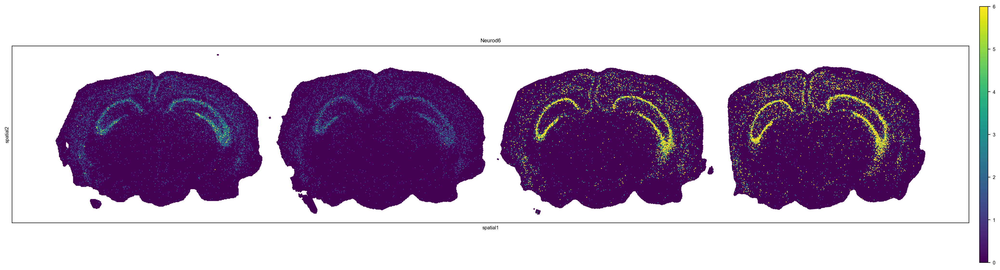

In [53]:
adata=sc.read_h5ad('/home/lixinxing/V2/diffusion/opencv/data_3/merge.h5ad')

fig, ax = plt.subplots(figsize=(28, 7))
sc.pl.spatial(adata,color='Neurod6',spot_size=80,vmax='p99',cmap='viridis',ax=ax)
plt.show()

In [8]:
adata.obs['sample'].unique()

['D03558A5', 'Y00583L7', 'C04027G3', 'Y00583N7']
Categories (4, object): ['C04027G3', 'D03558A5', 'Y00583L7', 'Y00583N7']

In [108]:
unique_chips = adata.obs['sample'].unique()

for chip in unique_chips:
    adata_chip = adata[adata.obs['sample'] == chip].copy()
    sc.pp.filter_genes(adata, min_cells=3)
    sf = SpaceFlow.SpaceFlow(adata=adata_chip, count_matrix=adata_chip.X, spatial_locs=adata_chip.obsm['spatial'], sample_names=adata_chip.obs_names, gene_names=adata_chip.var_names)
    sf.preprocessing_data(n_top_genes=3000)
    sf.train(spatial_regularization_strength=0.1, z_dim=50, lr=1e-3, epochs=1000, max_patience=50, min_stop=100, random_seed=42, gpu=0, regularization_acceleration=True, edge_subset_sz=1000000)
    
    domain_label_filepath = f"./merge/{chip}_merge_domains.tsv"
    sf.segmentation(domain_label_save_filepath=domain_label_filepath, n_neighbors=50, resolution=1.2)
    
    segmentation_figure_filepath = f"./merge/{chip}_merge_domain_50_1.2.pdf"
    sf.plot_segmentation(segmentation_figure_save_filepath=segmentation_figure_filepath, colormap="tab20", scatter_sz=0.1, rsz=4., csz=4., wspace=.4, hspace=.5, left=0.125, right=0.9, bottom=0.1, top=0.9)

Epoch 2/1000, Loss: 1.4522881507873535
Epoch 12/1000, Loss: 1.3650192022323608
Epoch 22/1000, Loss: 1.0388165712356567
Epoch 32/1000, Loss: 0.7492519617080688
Epoch 42/1000, Loss: 0.5870632529258728
Epoch 52/1000, Loss: 0.4835648238658905
Epoch 62/1000, Loss: 0.40798163414001465
Epoch 72/1000, Loss: 0.33977076411247253
Epoch 82/1000, Loss: 0.29537972807884216
Epoch 92/1000, Loss: 0.25866276025772095
Epoch 102/1000, Loss: 0.22815310955047607
Epoch 112/1000, Loss: 0.2055412232875824
Epoch 122/1000, Loss: 0.18788470327854156
Epoch 132/1000, Loss: 0.1745406836271286
Epoch 142/1000, Loss: 0.15896600484848022
Epoch 152/1000, Loss: 0.15111523866653442
Epoch 162/1000, Loss: 0.13937199115753174
Epoch 172/1000, Loss: 0.131084144115448
Epoch 182/1000, Loss: 0.12559209764003754
Epoch 192/1000, Loss: 0.12064856290817261
Epoch 202/1000, Loss: 0.11860835552215576
Epoch 212/1000, Loss: 0.11254788935184479
Epoch 222/1000, Loss: 0.10759423673152924
Epoch 232/1000, Loss: 0.10431930422782898
Epoch 242/100

In [ ]:
for chip in unique_chips:
    domain_label_filepath = f"./merge/{chip}_merge_domains.tsv"
    leiden = pd.read_csv(domain_label_filepath, header=None)  
    adata_chip = adata[adata.obs['sample'] == chip].copy()
    adata_chip.obs['leiden'] = leiden[0].values
    adata_chip.write_h5ad(f"./merge/{chip}_leiden.h5ad")

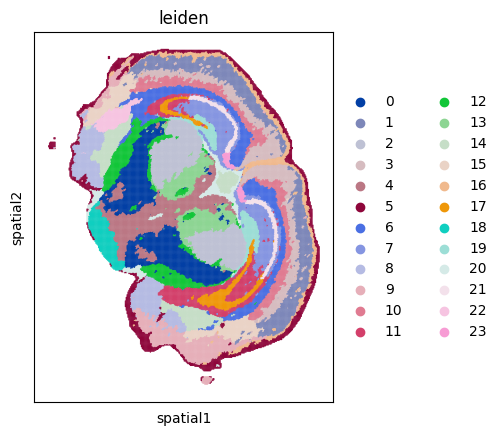

In [113]:
chip='Y00583L7'
fig, ax = plt.subplots(figsize=(6, 6))
sc.pl.spatial(adata[adata.obs['sample'] == chip],spot_size=100,color='leiden',basis='spin',ax=ax,cmap='tab20',legend_loc='on data')
plt.show()

# 1.Identifying Boundaries(Based on clustering results)

In [11]:
adata=sc.read_h5ad('/home/lixinxing/V2/diffusion/opencv/data_3/left/merge_hip.h5ad')
adata.obsm['bin50_spatial'] = adata.obsm['spatial']//50
adata.uns["__type"] = "UMI"
unique_chips = adata.obs['sample'].unique()

adata_subsets = {}
for chip in unique_chips:
    adata_subsets[chip] = adata[adata.obs['sample'] == chip].copy()

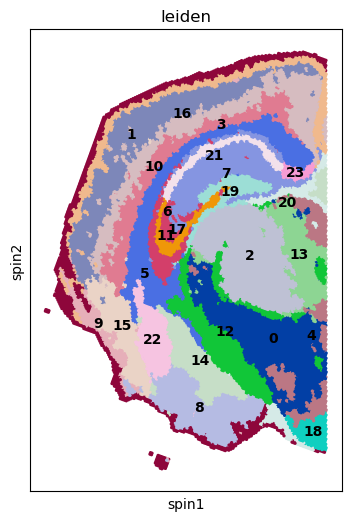

In [12]:
sample='Y00583L7'
fig, ax = plt.subplots(figsize=(6, 6))
sc.pl.spatial(adata_subsets[sample],spot_size=100,color='leiden',basis='spin',ax=ax,cmap='tab20',legend_loc='on data')
plt.show()

|-----> Setting up source and target area.
|-----> Identifying boundary.
|-----> Set up the color for the clusters with the tab20 colormap.
|-----> Saving integer labels for clusters into adata.obs['cluster_img_label'].
|-----> Prepare a mask image and assign each pixel to the corresponding cluster id.
|-----> Get selected areas with label id(s): [2].
|-----> Close morphology of the area formed by cluster [2].
|-----> Remove small region(s).
|-----> Extract contours.
|-----> Get selected areas with label id(s): [3].
|-----> Close morphology of the area formed by cluster [3].
|-----> Remove small region(s).
|-----> Extract contours.
|-----> Generating boundary line image.
|-----> Saving boundary into adata.obs['boundary_line'] for visualization.


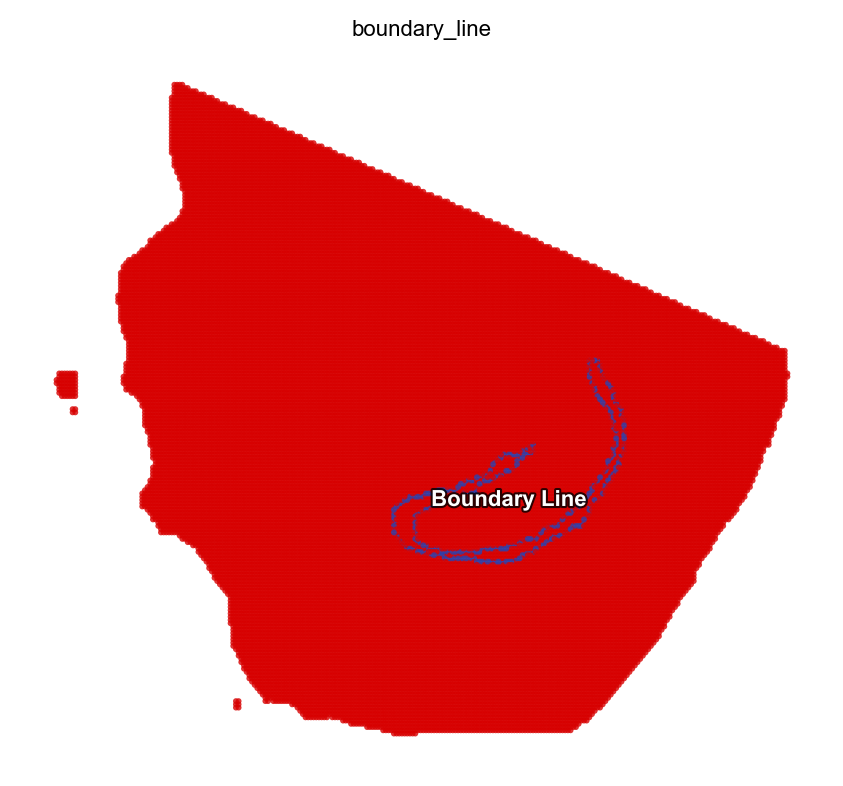

In [16]:
bdl_img = st.dd.identify_boundary(
    adata=adata_subsets['Y00583L7'],
    spatial_key="bin50_spatial",
    cluster_key="leiden",
    bin_size=1,
    source_id=['21','17'],
    target_id=['19','7','11'],
)

st.pl.space(adata_subsets['Y00583L7'], color=['boundary_line'], pointsize=0.2, cmap = "Reds")

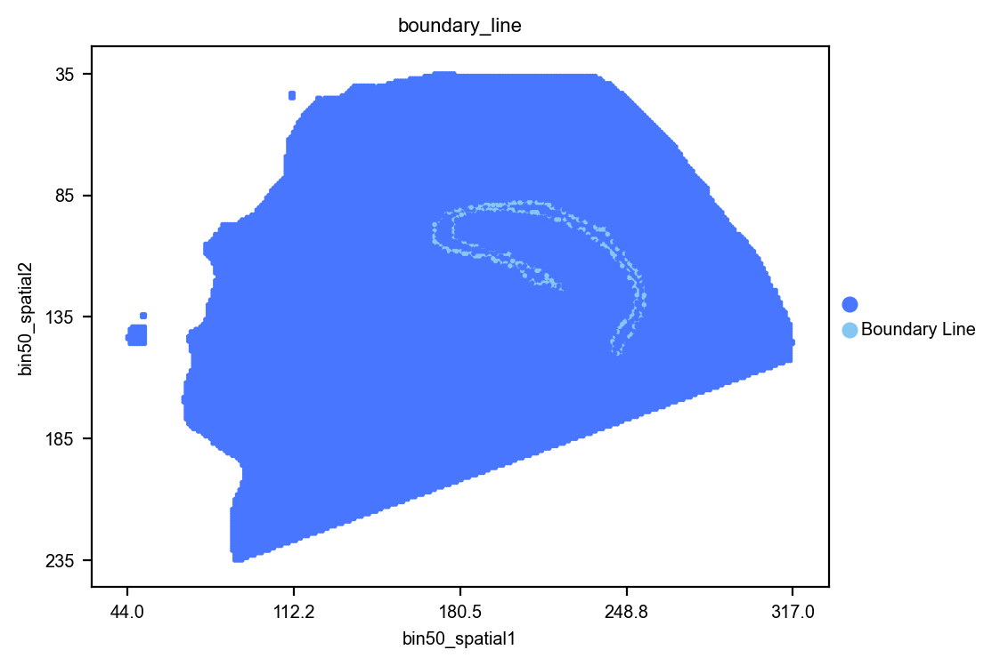

In [17]:
axs = sc.pl.spatial(adata_subsets['Y00583L7'],color=['boundary_line'],spot_size=2,basis='bin50_spatial',show=False)

for ax in axs:
    ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
    spatial_coords = adata_subsets['Y00583L7'].obsm['bin50_spatial']
    ax.set_xticks(np.linspace(spatial_coords[:, 0].min(), spatial_coords[:, 0].max(), num=5))
    ax.set_yticks(np.linspace(spatial_coords[:, 1].min(), spatial_coords[:, 1].max(), num=5))

plt.show()

# 2. Identify and extract boundaries

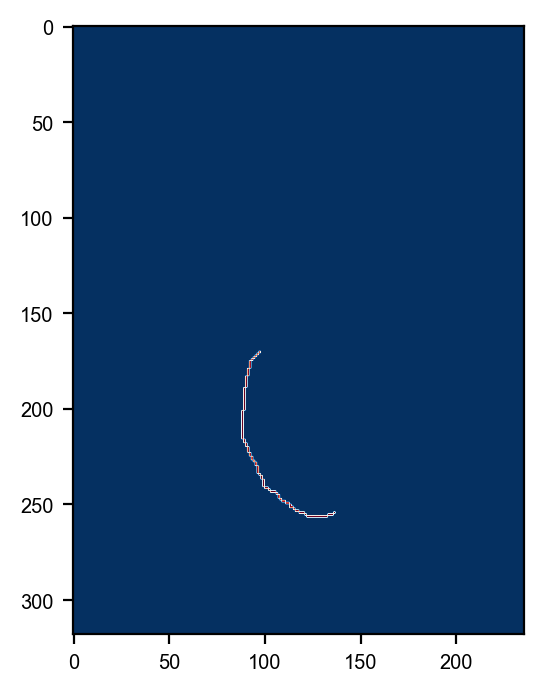

In [18]:
boundary_line_img = bdl_img

ctrs, _ = cv.findContours(boundary_line_img, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_NONE)
formatted_bdl_img = np.zeros_like(boundary_line_img, dtype=np.uint8)

# n=0

all_points=ctrs[0].reshape(-1,2)
distances = distance.cdist(all_points, all_points, 'euclidean')  

# Find the two most distant points as the starting and ending points
farthest_pts_idx = np.unravel_index(np.argmax(distances), distances.shape)
pt_start = tuple(all_points[farthest_pts_idx[0]])
pt_end = tuple(all_points[farthest_pts_idx[1]])

# pt_start=(212,126)
# pt_end=(258,153)
fmt_bdl_ls, fmt_bdl_img = format_boundary_line(bdl_img, pt_start, pt_end)
plt.imshow(fmt_bdl_img)

In [21]:
px.imshow(fmt_bdl_img) #Interactive

# 3. (Optional): Fit interpolation for discontinuous boundaries

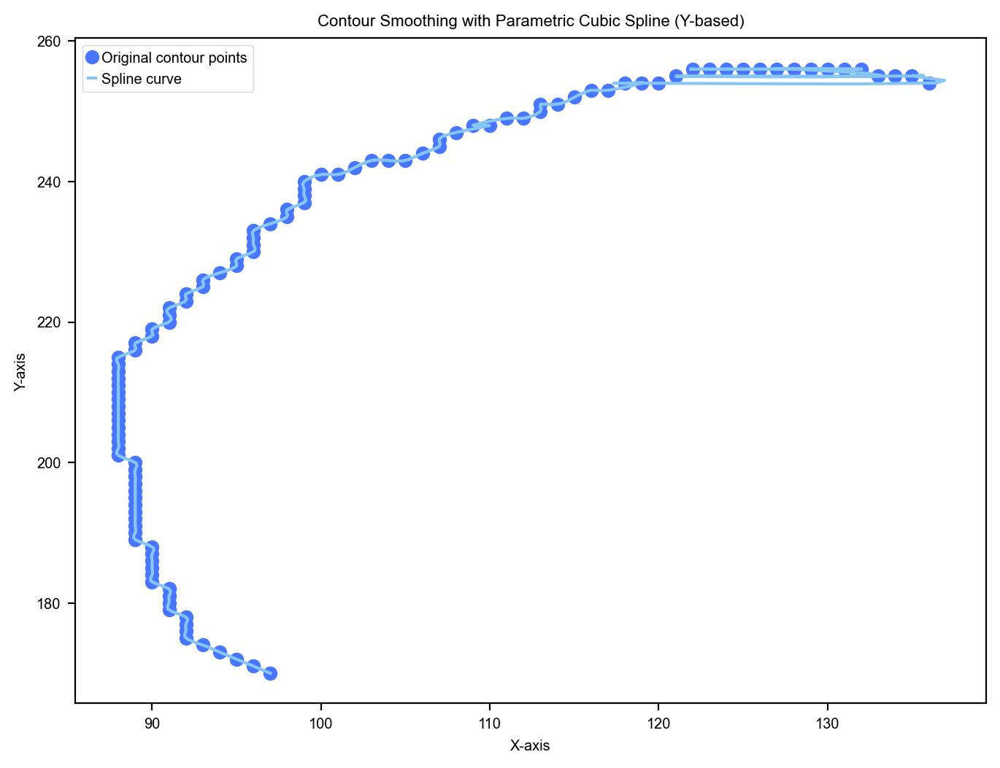

In [20]:
x_new, y_new = extract_and_smooth_contours_y_based(fmt_bdl_img)

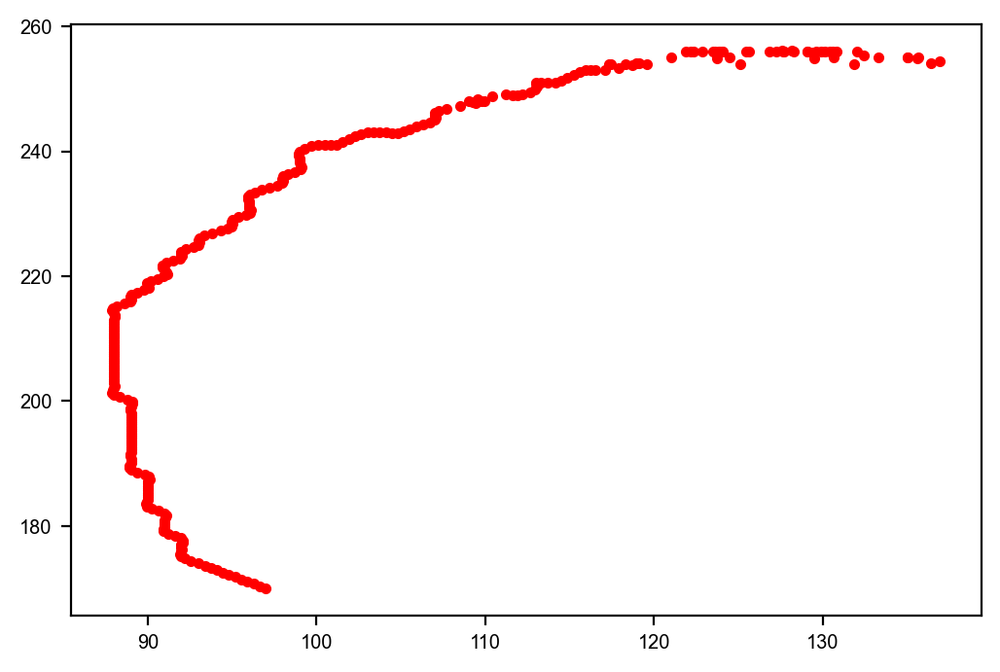

In [21]:
plt.scatter(x_new, y_new, c='r', marker='.',linewidths=1)
plt.show()

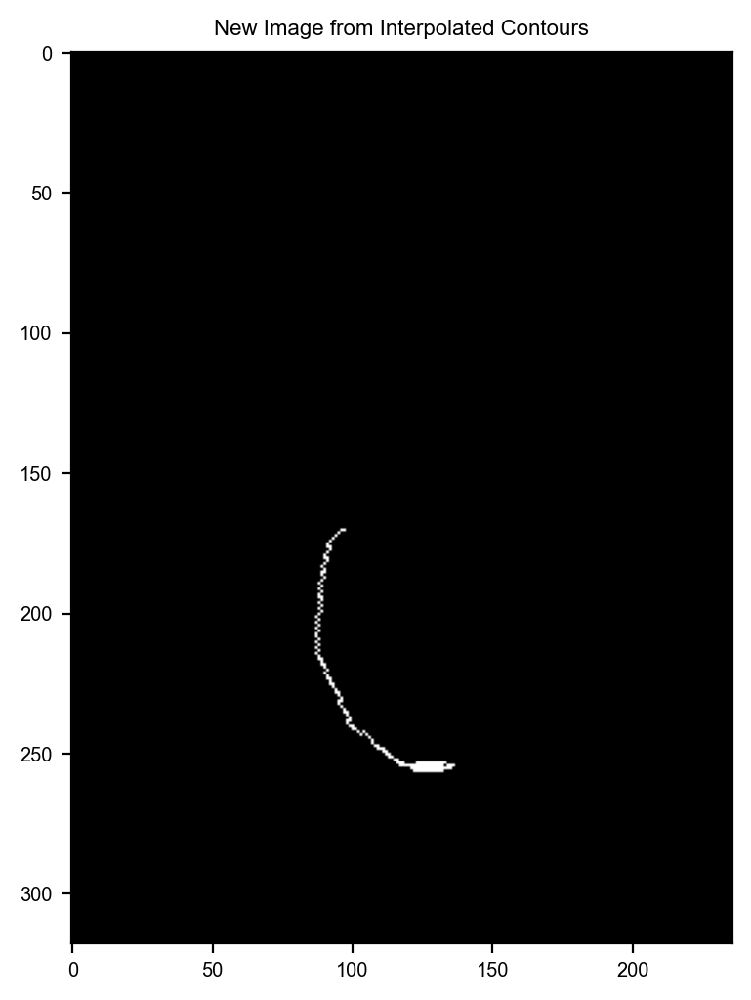

In [31]:
new_img = points_to_image(x_new, y_new, bdl_img.shape)

plt.figure(figsize=(8, 6))
plt.imshow(new_img, cmap='gray')
plt.title("New Image from Interpolated Contours")
plt.show()

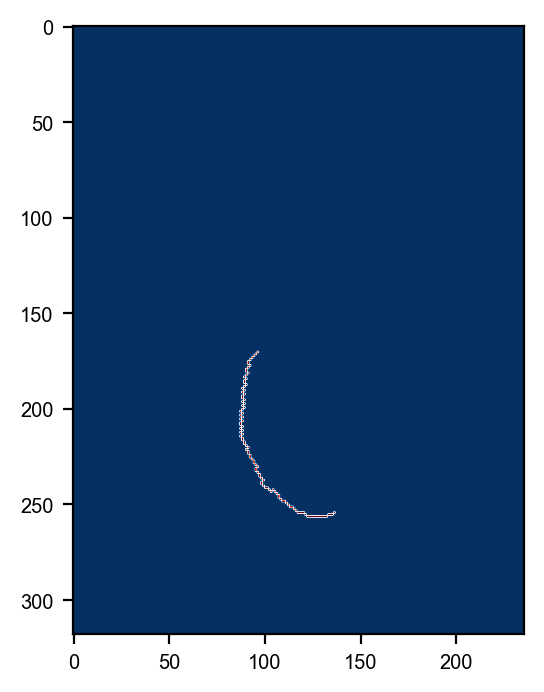

In [23]:
ctrs, _ = cv.findContours(new_img, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_NONE)

# all_points = np.vstack([ctr.reshape(-1, 2) for ctr in ctrs])  
all_points = ctrs[0].reshape(-1, 2)
distances = distance.cdist(all_points, all_points, 'euclidean')  

farthest_pts_idx = np.unravel_index(np.argmax(distances), distances.shape)
pt_start = tuple(all_points[farthest_pts_idx[0]])
pt_end = tuple(all_points[farthest_pts_idx[1]])
pt_start,pt_end

fmt_bdl_ls, fmt_bdl_img = format_boundary_line(new_img, pt_start, pt_end)
plt.imshow(fmt_bdl_img)

# 4.Quadratic Polynomial Smoothing Fit

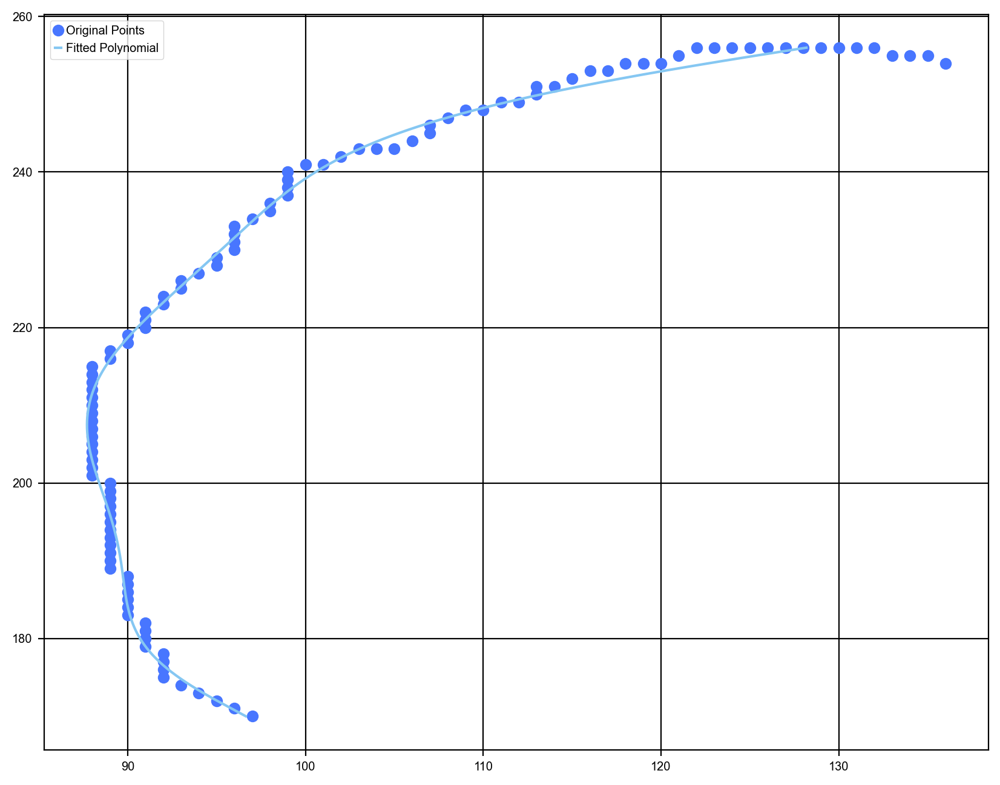

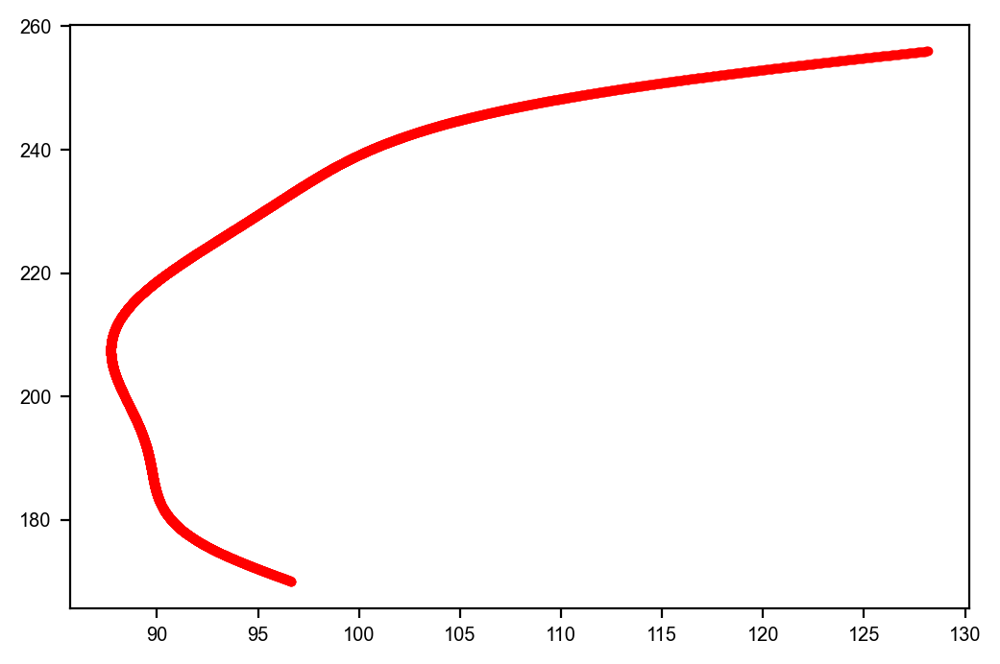

In [23]:
fmt_bdl_ls_array=np.array(fmt_bdl_ls)

x_fit, y_fit = fit_polynomial(fmt_bdl_ls_array, degree=8, variable='y')

plt.figure(figsize=(10, 8))
plt.plot(fmt_bdl_ls_array[:, 0], fmt_bdl_ls_array[:, 1], 'o', label='Original Points')
plt.plot(x_fit, y_fit, '-', label='Fitted Polynomial')
plt.legend()
plt.grid(True)
plt.show()

plt.scatter(x_fit, y_fit, c='r', marker='.',linewidths=0.5)
plt.show()

# 5. Align the boundary coordinates with the spatial coordinates

In [14]:
fmt_bdl_ls_swapped = [(y, x) for x, y in fmt_bdl_ls]

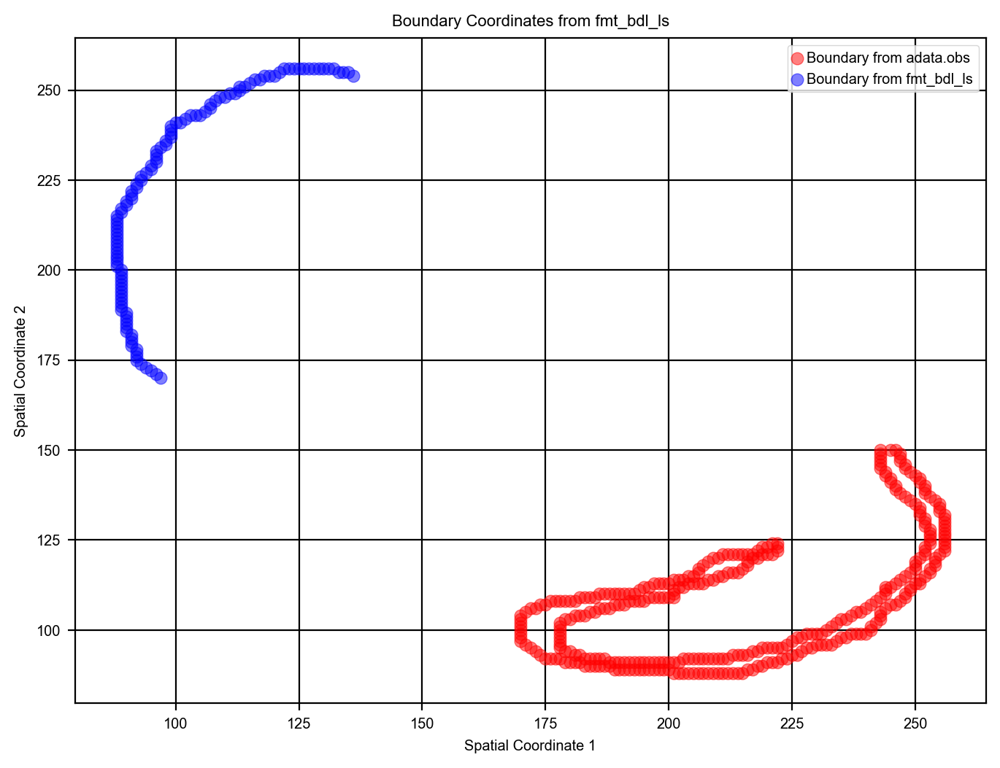

In [15]:
adata=adata_subsets[sample].copy()

boundary_indices = adata.obs['boundary_line'] == 'Boundary Line'
boundary_points = adata.obsm['bin50_spatial'][boundary_indices]

plt.figure(figsize=(8, 6))
plt.scatter(boundary_points[:, 0], boundary_points[:, 1], c='red', label='Boundary from adata.obs', alpha=0.5)
plt.title('Boundary Points from adata.obs[\'boundary_line\']')
plt.xlabel('Spatial Coordinate 1')
plt.ylabel('Spatial Coordinate 2')
plt.legend()
plt.grid(True)
# plt.show()

boundary_coords = np.array(fmt_bdl_ls) 

# plt.figure(figsize=(8, 6))
plt.scatter(boundary_coords[:, 0], boundary_coords[:, 1], c='blue', label='Boundary from fmt_bdl_ls', alpha=0.5)
plt.title('Boundary Coordinates from fmt_bdl_ls')
plt.xlabel('Spatial Coordinate 1')
plt.ylabel('Spatial Coordinate 2')
plt.legend()
plt.grid(True)
plt.show()

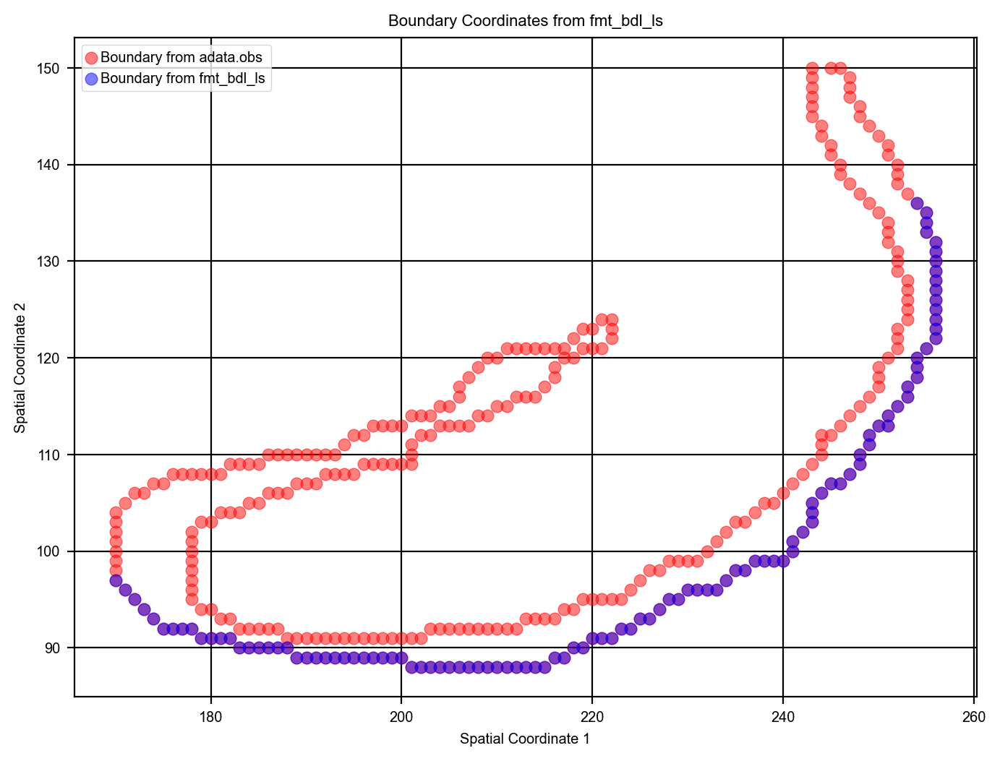

In [16]:
import numpy as np
import matplotlib.pyplot as plt

adata=adata_subsets[sample].copy()

boundary_indices = adata.obs['boundary_line'] == 'Boundary Line'
boundary_points = adata.obsm['bin50_spatial'][boundary_indices]

plt.figure(figsize=(8, 6))
plt.scatter(boundary_points[:, 0], boundary_points[:, 1], c='red', label='Boundary from adata.obs', alpha=0.5)
plt.title('Boundary Points from adata.obs[\'boundary_line\']')
plt.xlabel('Spatial Coordinate 1')
plt.ylabel('Spatial Coordinate 2')
plt.legend()
plt.grid(True)
# plt.show()

boundary_coords = np.array(fmt_bdl_ls_swapped) 

# plt.figure(figsize=(8, 6))
plt.scatter(boundary_coords[:, 0], boundary_coords[:, 1], c='blue', label='Boundary from fmt_bdl_ls', alpha=0.5)
plt.title('Boundary Coordinates from fmt_bdl_ls')
plt.xlabel('Spatial Coordinate 1')
plt.ylabel('Spatial Coordinate 2')
plt.legend()
plt.grid(True)
plt.show()

# 6.(Optional, with Step 3): Rearrange coordinates based on the boundary centroid when discontinuous

In [88]:
fmt_bdl_ls_2 = np.array(fmt_bdl_ls_swapped)  
centroid = np.mean(fmt_bdl_ls_2, axis=0)   

angles = np.arctan2(fmt_bdl_ls_2[:, 1] - centroid[1], fmt_bdl_ls_2[:, 0] - centroid[0]) 

sorted_indices = np.argsort(angles)
sorted_boundary = fmt_bdl_ls_2[sorted_indices]  

# 7.KDTree-based hierarchical segmentation and dot product for layer direction determination

layer_labels
-4.0    299
-0.0    288
-2.0    283
-3.0    273
-1.0    271
 1.0    234
 2.0    221
 4.0    191
 3.0    189
-5.0     47
 5.0     25
Name: count, dtype: int64


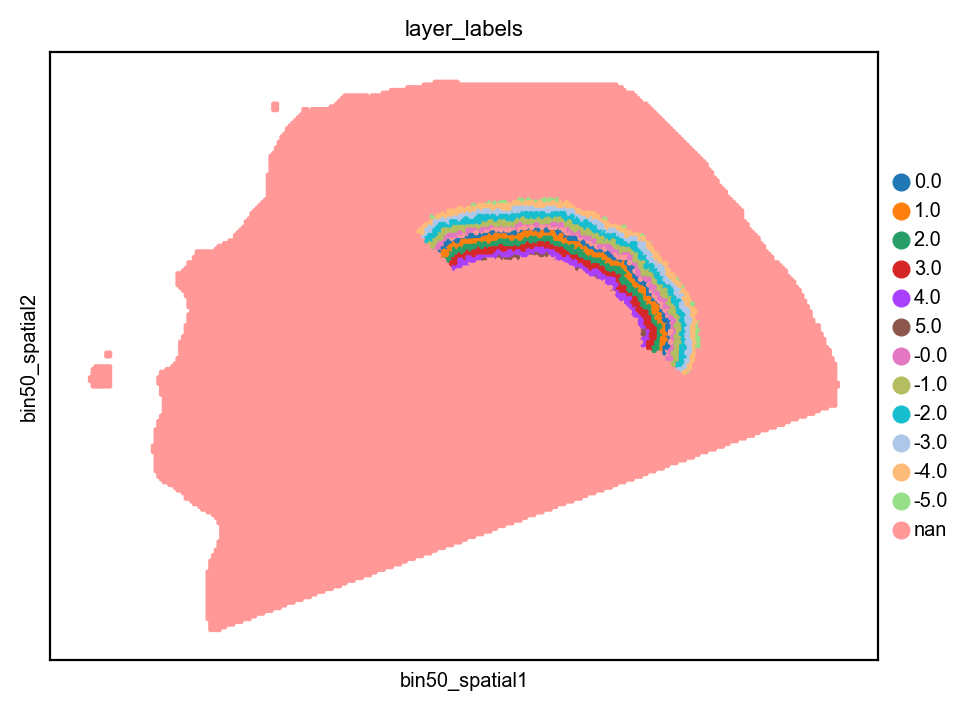

In [17]:
boundary_coords = np.array(fmt_bdl_ls_swapped)
adata_updated = generate_layers_using_kdtree(adata_subsets[sample], boundary_coords, spatial_key='bin50_spatial', max_distance=10)

print(adata_updated.obs['layer_labels'].value_counts())
adata_updated.obs['layer_labels'] = adata_updated.obs['layer_labels'].astype(str)
sc.pl.spatial(adata_updated, color='layer_labels', spot_size=2, basis='bin50_spatial', cmap='Set3')

In [ ]:
adata_subsets[sample].obs['hip_layer']=adata_subsets[sample].obs['layer_labels'].copy()

### Demonstrate the rationality of the layering

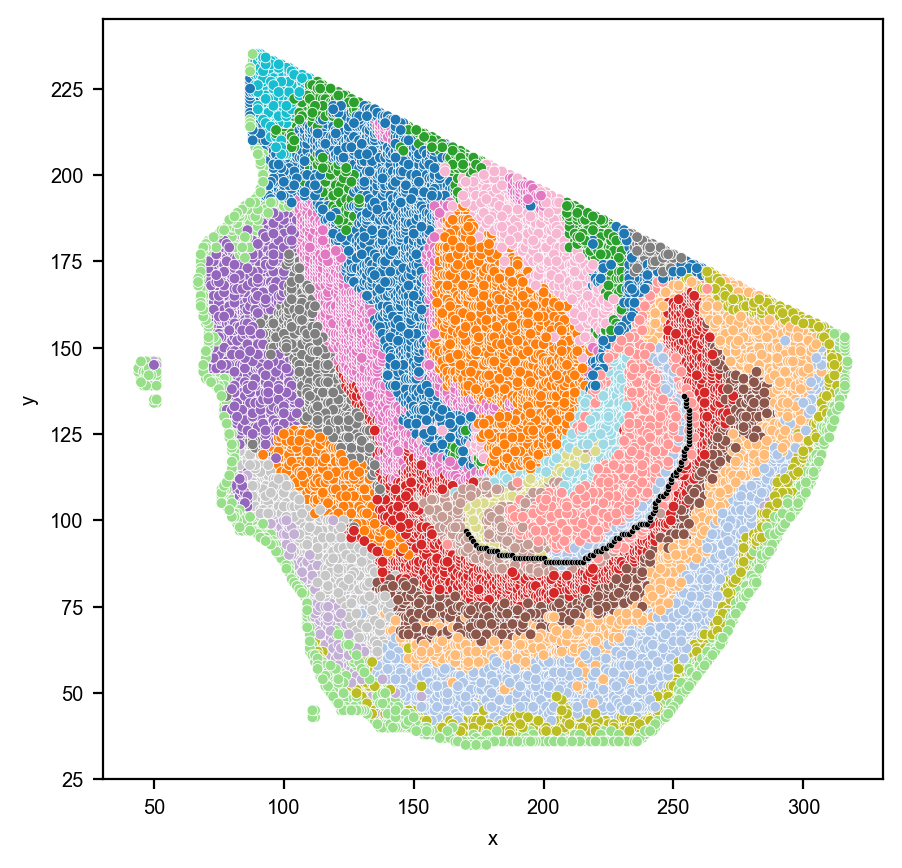

In [18]:
new_filtered=adata_subsets[sample].copy()

coordinates = pd.DataFrame(new_filtered.obsm['bin50_spatial'], columns=['x', 'y'])
coordinates['leiden'] = new_filtered.obs['leiden'].values
coordinates['layer'] = new_filtered.obs['layer_labels'].values

fig,ax= plt.subplots(figsize = (5,5))
sns.scatterplot(data=coordinates, x='x', y='y', hue='leiden', palette='tab20', s=15,legend=False,ax=ax)
sns.scatterplot(data=pd.DataFrame(fmt_bdl_ls),x=1,y=0,s = 5 ,color = 'black',ax =ax)

plt.show()

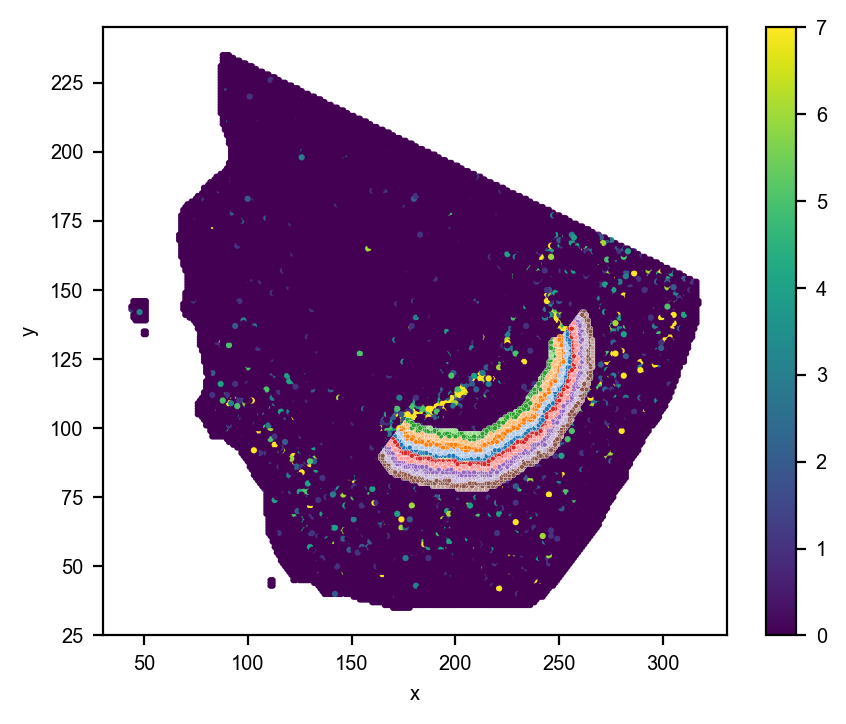

In [19]:
new_filtered = adata_subsets[sample].copy()

coordinates = pd.DataFrame(new_filtered.obsm['bin50_spatial'], columns=['x', 'y'])
coordinates['leiden'] = new_filtered.obs['leiden'].values
coordinates['layer'] = new_filtered.obs['layer_labels'].values  

gene_name = "Neurod6"
coordinates['gene_expression'] = new_filtered[:, gene_name].X.toarray().ravel()
noncoordinates = coordinates[coordinates['layer']!='nan']

fig, ax = plt.subplots(figsize=(5, 4))

norm = mcolors.Normalize(vmin=coordinates['gene_expression'].min(), vmax=coordinates['gene_expression'].quantile(0.99))
scatter = ax.scatter('x', 'y', c='gene_expression', data=coordinates, cmap='viridis', norm=norm, s=5, edgecolor='none')
sns.scatterplot(data=noncoordinates, x='x', y='y', hue='layer', palette='tab20', s=3, ax=ax, legend=False)

cbar = plt.colorbar(scatter, ax=ax)
plt.show()

### Boundary saving and loading

In [ ]:
fmt_bdl_ls_swapped_array = np.array(fmt_bdl_ls_swapped)  
np.savez(f"/home/lixinxing/V2/diffusion/opencv/data_3/left/{sample}_hip_coordinates.npz", fmt_bdl_ls=fmt_bdl_ls_swapped_array)
# data = np.load("boundary_coordinates.npz")
# fmt_bdl_ls_swapped = data['fmt_bdl_ls']

# 8.Batch plotting-hip-Neurod6

In [3]:
adata_bin5=sc.read_h5ad('/home/lixinxing/V2/diffusion/opencv/data_3/bin5/left_hip/merge_hip_20_800_new.h5ad')
unique_chips = adata_bin5.obs['sample'].unique()

adata_subsets_bin5 = {}
for chip in unique_chips:
    adata_subsets_bin5[chip] = adata_bin5[adata_bin5.obs['sample'] == chip].copy()
    adata_subsets_bin5[chip].uns["__type"] = "UMI"
adata_subsets_bin5

/home/lixinxing/anaconda3/envs/opencv_2/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning:

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.



{'C04027G3': AnnData object with n_obs × n_vars = 3119157 × 28445
     obs: 'orig.ident', 'x', 'y', 'x_new', 'y_new', 'coords', 'hip_layer', 'sample', 'layer_labels', 'hip_layer_new'
     uns: '__type'
     obsm: 'bin50_spatial', 'spatial',
 'Y00583N7': AnnData object with n_obs × n_vars = 3095992 × 28445
     obs: 'orig.ident', 'x', 'y', 'x_new', 'y_new', 'coords', 'hip_layer', 'sample', 'layer_labels', 'hip_layer_new'
     uns: '__type'
     obsm: 'bin50_spatial', 'spatial',
 'Y00583L7': AnnData object with n_obs × n_vars = 3210798 × 28445
     obs: 'orig.ident', 'x', 'y', 'x_new', 'y_new', 'coords', 'hip_layer', 'sample', 'layer_labels', 'hip_layer_new'
     uns: '__type'
     obsm: 'bin50_spatial', 'spatial',
 'D03558A5': AnnData object with n_obs × n_vars = 3466966 × 28445
     obs: 'orig.ident', 'x', 'y', 'x_new', 'y_new', 'coords', 'hip_layer', 'sample', 'layer_labels', 'hip_layer_new'
     uns: '__type'
     obsm: 'bin50_spatial', 'spatial'}

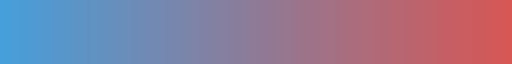

In [17]:
colors = ['#479FDA', '#D75755']
cmap_name = 'custom_cmap'
cmap = LinearSegmentedColormap.from_list(cmap_name, colors, N=90)
cmap

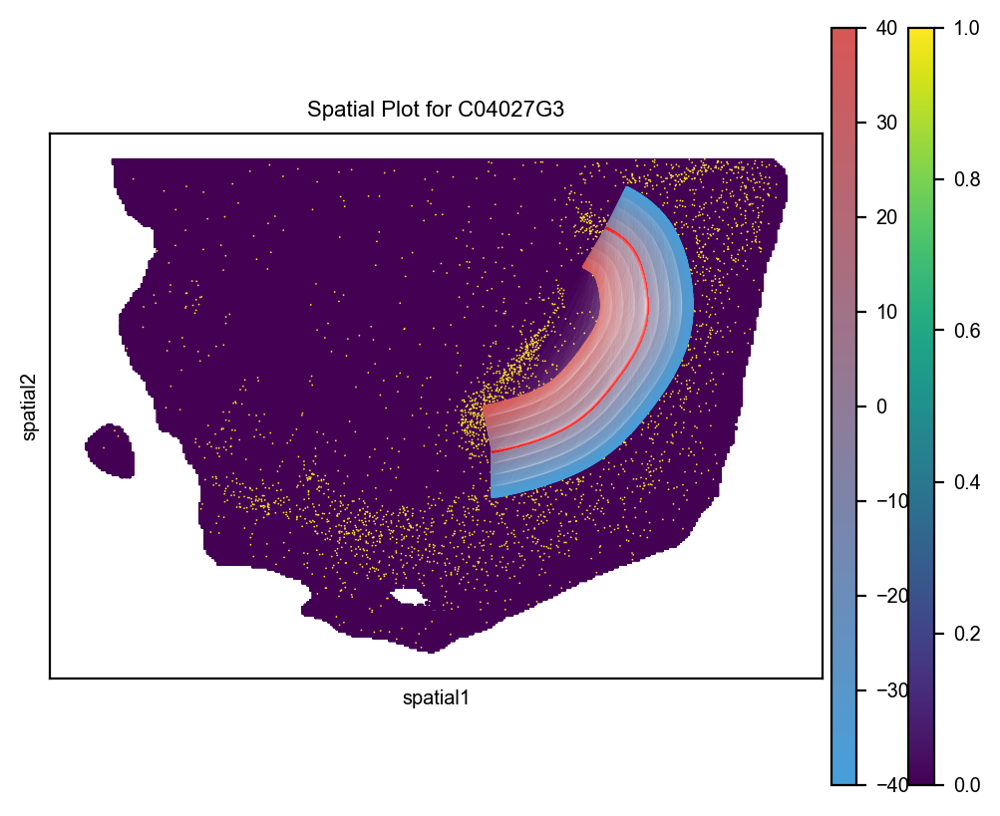

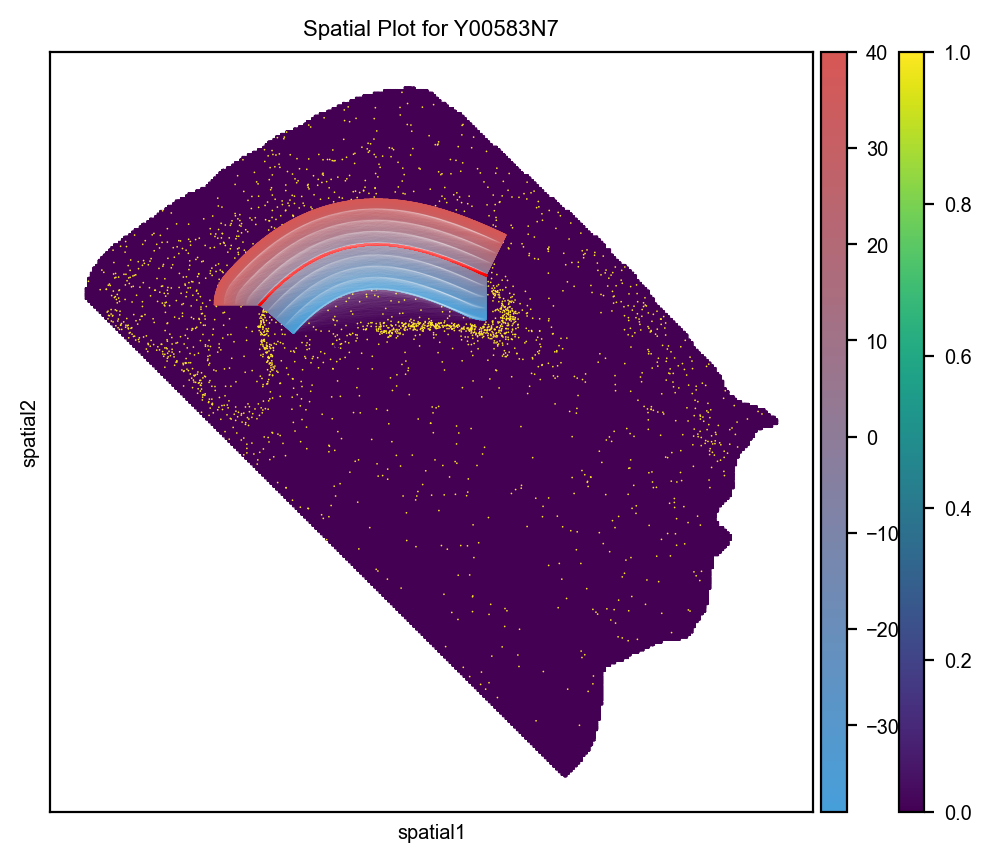

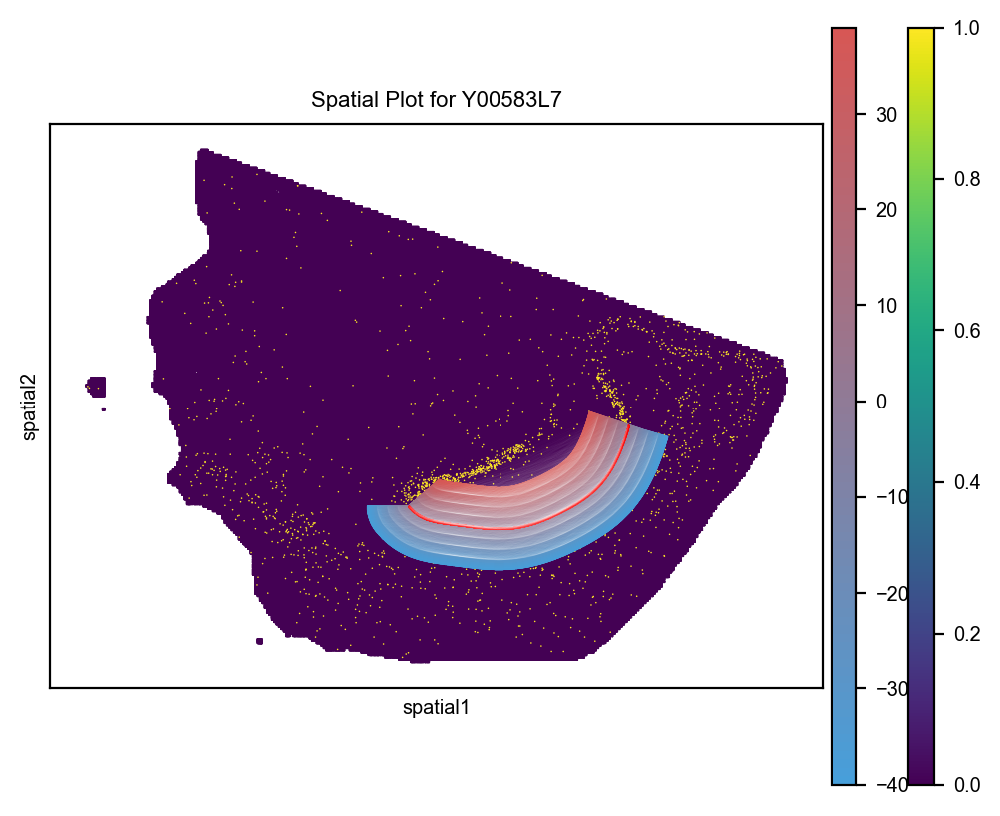

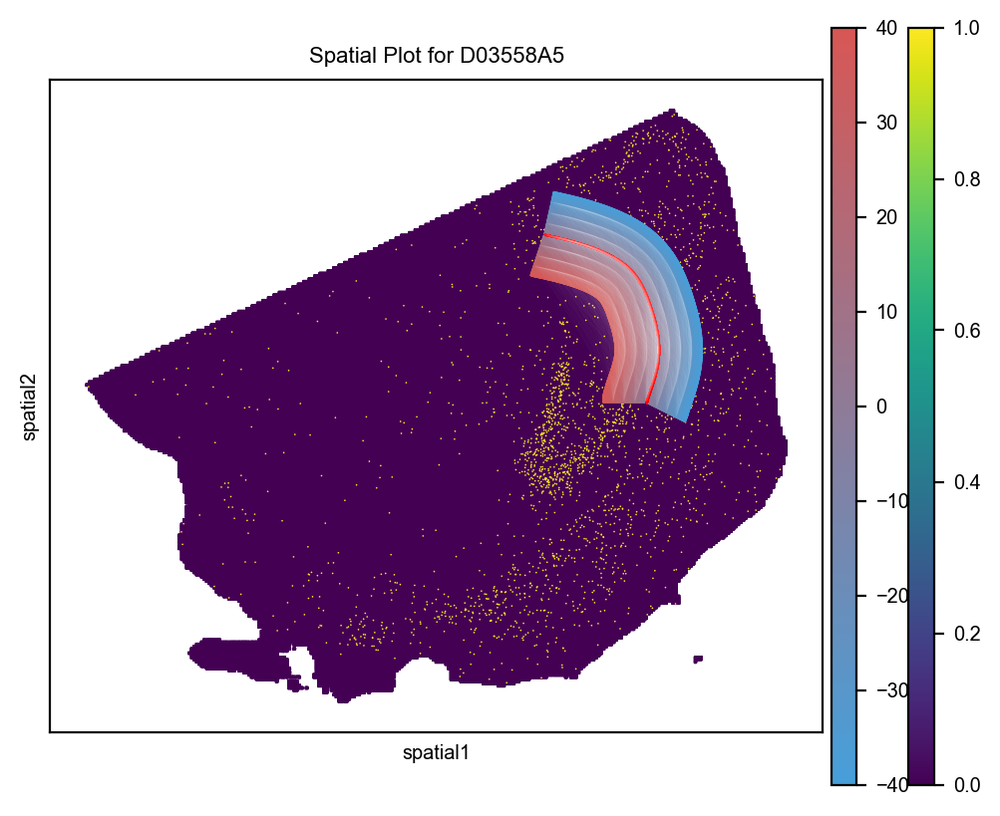

In [73]:
gene = 'Neurod6' 
layer='hip_layer_new'
tissue='hip'

for sample in adata_subsets_bin5.keys():
    data = np.load(f"/home/lixinxing/V2/diffusion/opencv/data_3/left/{sample}_{tissue}_new_coordinates.npz")
    fmt_bdl_ls = data['fmt_bdl_ls']

    adata_subsets_bin5[sample].obs[layer] = pd.to_numeric(adata_subsets_bin5[sample].obs[layer], errors='coerce')  
    adata_hip = adata_subsets_bin5[sample][~adata_subsets_bin5[sample].obs[layer].isna()].copy()

    fig, ax = plt.subplots(figsize=(6, 5))
    sc.pl.spatial(adata_subsets_bin5[sample], color=gene, spot_size=30, show=False, ax=ax, cmap='viridis', vmax=1, vmin=0)
    sc.pl.spatial(adata_hip, color=[layer], spot_size=30, ax=ax, show=False, alpha_img=0.2, legend_loc=None, cmap=cmap)
    
    unique_layers = adata_hip.obs[layer].unique()
    sorted_layers = np.sort(unique_layers)

    for i in range(0, len(sorted_layers), 10):
        layer_value = sorted_layers[i]
        layer_boundary = adata_hip[adata_hip.obs[layer] == layer_value]
        ax.plot(layer_boundary.obsm['spatial'][:, 0], layer_boundary.obsm['spatial'][:, 1], c='white', lw=0.002, alpha=0.7, linestyle='--', rasterized=True)  

    ax.scatter(fmt_bdl_ls[:,0], fmt_bdl_ls[:,1], c='red', s=0.01, alpha=1, rasterized=True)  

    plt.title(f"Spatial Plot for {sample}")
    plt.show()
    # fig.savefig(f'../fig_new/{sample}_{gene}_{tissue}.pdf', dpi=300)  

# 9.Fit the gene expression curve for each layer

In [35]:
adata_bin5=sc.read_h5ad('/home/lixinxing/V2/diffusion/opencv/data_3/bin5/left_hip/merge_hip_20_800_new.h5ad')
unique_chips = adata_bin5.obs['sample'].unique()
adata_subsets_bin5 = {}
for chip in unique_chips:
    adata_subsets_bin5[chip] = adata_bin5[adata_bin5.obs['sample'] == chip].copy()

adata_subsets_bin5

/home/lixinxing/anaconda3/envs/opencv_2/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning:

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.



{'C04027G3': AnnData object with n_obs × n_vars = 3119157 × 28445
     obs: 'orig.ident', 'x', 'y', 'x_new', 'y_new', 'coords', 'hip_layer', 'sample', 'layer_labels', 'hip_layer_new'
     obsm: 'bin50_spatial', 'spatial',
 'Y00583N7': AnnData object with n_obs × n_vars = 3095992 × 28445
     obs: 'orig.ident', 'x', 'y', 'x_new', 'y_new', 'coords', 'hip_layer', 'sample', 'layer_labels', 'hip_layer_new'
     obsm: 'bin50_spatial', 'spatial',
 'Y00583L7': AnnData object with n_obs × n_vars = 3210798 × 28445
     obs: 'orig.ident', 'x', 'y', 'x_new', 'y_new', 'coords', 'hip_layer', 'sample', 'layer_labels', 'hip_layer_new'
     obsm: 'bin50_spatial', 'spatial',
 'D03558A5': AnnData object with n_obs × n_vars = 3466966 × 28445
     obs: 'orig.ident', 'x', 'y', 'x_new', 'y_new', 'coords', 'hip_layer', 'sample', 'layer_labels', 'hip_layer_new'
     obsm: 'bin50_spatial', 'spatial'}

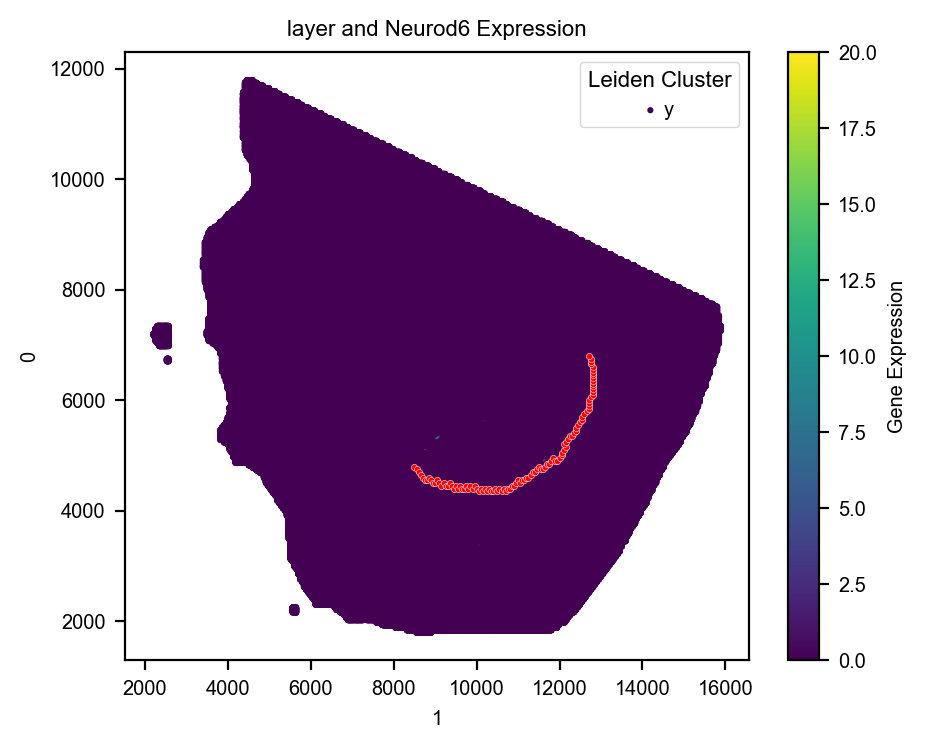

In [38]:
new_filtered = adata_subsets_bin5[sample].copy()

coordinates = pd.DataFrame(new_filtered.obsm['spatial'], columns=['x', 'y'])

gene_name = "Neurod6"
coordinates['gene_expression'] = new_filtered[:, gene_name].X.toarray().ravel()

fig, ax = plt.subplots(figsize=(5, 4))

norm = mcolors.Normalize(vmin=coordinates['gene_expression'].min(), vmax=coordinates['gene_expression'].quantile(1))
scatter = ax.scatter('x', 'y', c='gene_expression', data=coordinates, cmap='viridis', norm=norm, s=5, edgecolor='none')
sns.scatterplot(data=pd.DataFrame(fmt_bdl_ls)*50,x=1,y=0,s = 5 ,color = 'red',ax =ax)

cbar = plt.colorbar(scatter, ax=ax)
cbar.set_label('Gene Expression')

plt.title(f'layer and {gene_name} Expression')
plt.legend(title='Leiden Cluster')
plt.show()

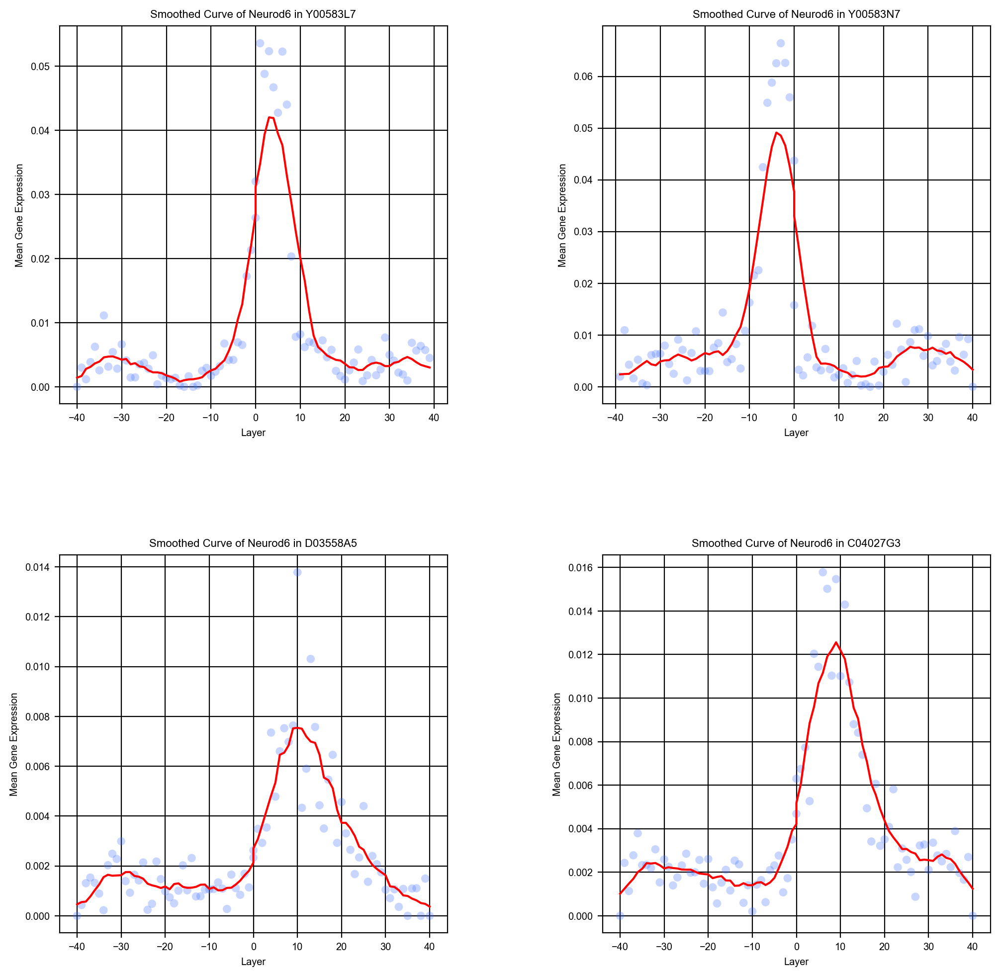

In [59]:
gene = 'Neurod6'
layer = 'hip_layer_new'
window_size = 10

rois = {
    'Y00583L7': adata_subsets_bin5['Y00583L7'],
    'Y00583N7': adata_subsets_bin5['Y00583N7'],
    'D03558A5': adata_subsets_bin5['D03558A5'],
    'C04027G3': adata_subsets_bin5['C04027G3'],
}

fig, axs = plt.subplots(2, 2, figsize=(12, 12))
fig.subplots_adjust(hspace=0.4, wspace=0.4)

for idx, (name, data) in enumerate(rois.items()):
    data_filtered = data[~data.obs[layer].isin(['nan'])].copy()
    
    if issparse(data.X):
        gene_expression = data_filtered[:, gene].X.toarray().squeeze()
    else:
        gene_expression = data_filtered[:, gene].X.squeeze()
    
    data_filtered.obs[gene + '_expression'] = gene_expression

    grouped_data = data_filtered.obs.groupby(layer)[gene + '_expression'].mean().reset_index()
    grouped_data[layer] = pd.to_numeric(grouped_data[layer], errors='coerce')
    grouped_data = grouped_data.dropna().sort_values(by=layer) 

    
    window = np.ones(window_size) / window_size
    y_smooth = np.convolve(grouped_data[gene + '_expression'], window, mode='same')

    ax = axs[idx // 2, idx % 2]
    ax.plot(grouped_data[layer], y_smooth, color='red') 
    ax.scatter(grouped_data[layer], grouped_data[gene + '_expression'], alpha=0.3, edgecolors='none')
    ax.set_title(f'Smoothed Curve of {gene} in {name}')
    ax.set_xlabel('Layer')
    ax.set_ylabel('Mean Gene Expression')
    ax.grid(True)

plt.show()

# 10.Calculate the LWHM value

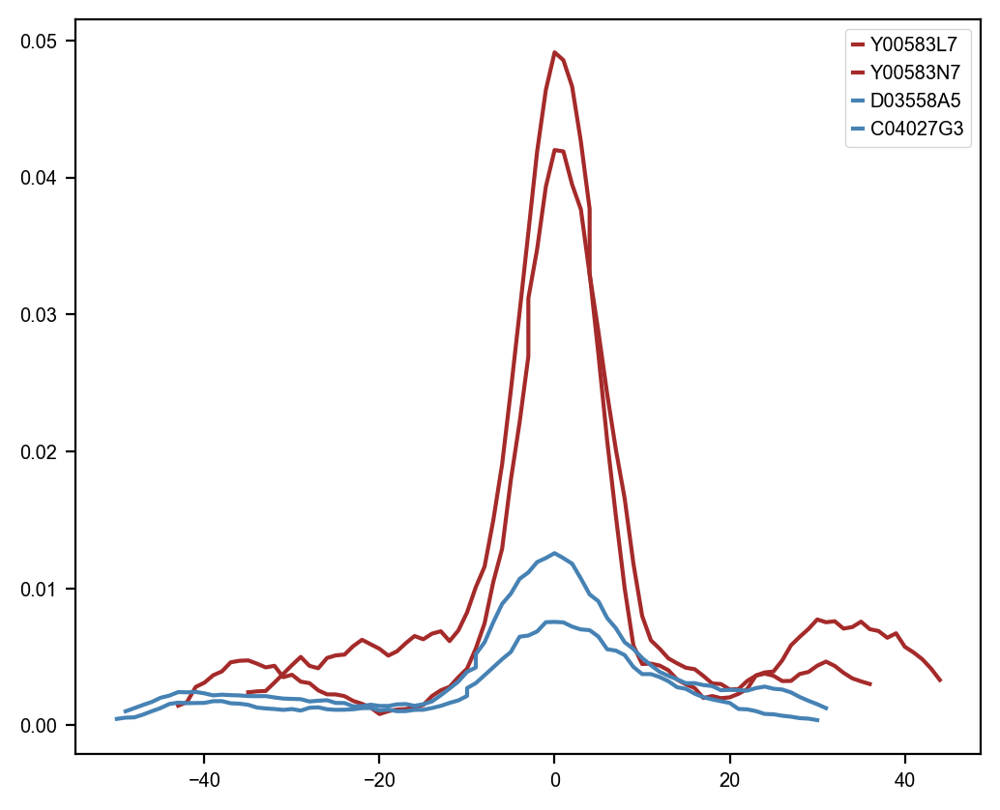

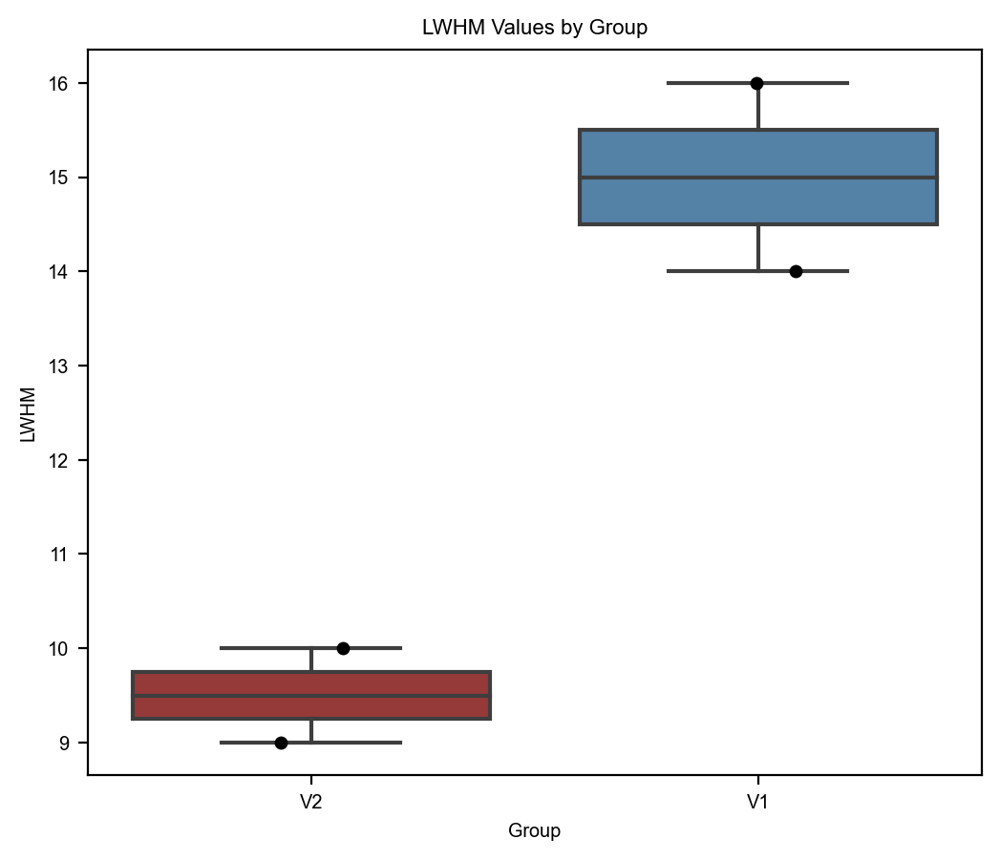

In [60]:
def smooth_curve(points, window_size=10):
    window = np.ones(window_size) / window_size
    y_smooth = np.convolve(points[:, 1], window, mode='same')
    return points[:, 0], y_smooth

gene = 'Neurod6'
layer = 'hip_layer_new'
window_size = 10

rois = {
    'Y00583L7': adata_subsets_bin5['Y00583L7'],
    'Y00583N7': adata_subsets_bin5['Y00583N7'],
    'D03558A5': adata_subsets_bin5['D03558A5'],
    'C04027G3': adata_subsets_bin5['C04027G3'],
}

v1_samples = ['D03558A5', 'C04027G3']
v2_samples = ['Y00583L7', 'Y00583N7']

lwhm_values = []
density_frames = []

for idx, (name, data) in enumerate(rois.items()):
    data_filtered = data[~data.obs[layer].isin(['nan'])].copy()
    
    if issparse(data.X):
        gene_expression = data_filtered[:, gene].X.toarray().squeeze()
    else:
        gene_expression = data_filtered[:, gene].X.squeeze()
    
    data_filtered.obs[gene + '_expression'] = gene_expression

    grouped_data = data_filtered.obs.groupby(layer)[gene + '_expression'].mean().reset_index()
    grouped_data[layer] = pd.to_numeric(grouped_data[layer], errors='coerce')
    grouped_data = grouped_data.dropna().sort_values(by=layer)

    points = grouped_data[[layer, gene + '_expression']].values
    x_fit, y_fit = smooth_curve(points, window_size=window_size)
    
    half_max = np.max(y_fit) / 2
    mask = y_fit >= half_max
    x_half = x_fit[mask]
    LWHM = x_half.max() - x_half.min()
    group = 'V1' if name in v1_samples else 'V2'
    
    temp_df = pd.DataFrame({
        'Adjusted Layer Distance': x_fit - x_fit[np.argmax(y_fit)],
        'Density': y_fit,
        'Sample': name
    })
    density_frames.append(temp_df)
    lwhm_values.append({'Sample': name, 'LWHM': LWHM, 'Group': group})

combined_density_df = pd.concat(density_frames)

plt.figure(figsize=(6, 5))
for name in rois.keys():
    subset = combined_density_df[combined_density_df['Sample'] == name]
    color = 'steelblue' if name in v1_samples else 'brown'
    plt.plot(subset['Adjusted Layer Distance'], subset['Density'], label=name, color=color)

plt.legend()
plt.show()

lwhm_df = pd.DataFrame(lwhm_values)
plt.figure(figsize=(6, 5))
sns.boxplot(data=lwhm_df, x='Group', y='LWHM', palette={'V2': 'brown', 'V1': 'steelblue'})
sns.stripplot(data=lwhm_df, x='Group', y='LWHM', color='black', jitter=True)
plt.title('LWHM Values by Group')
plt.show()

# Figure display in the main text

## HIP region — Cpne7 gene, Figure S1D

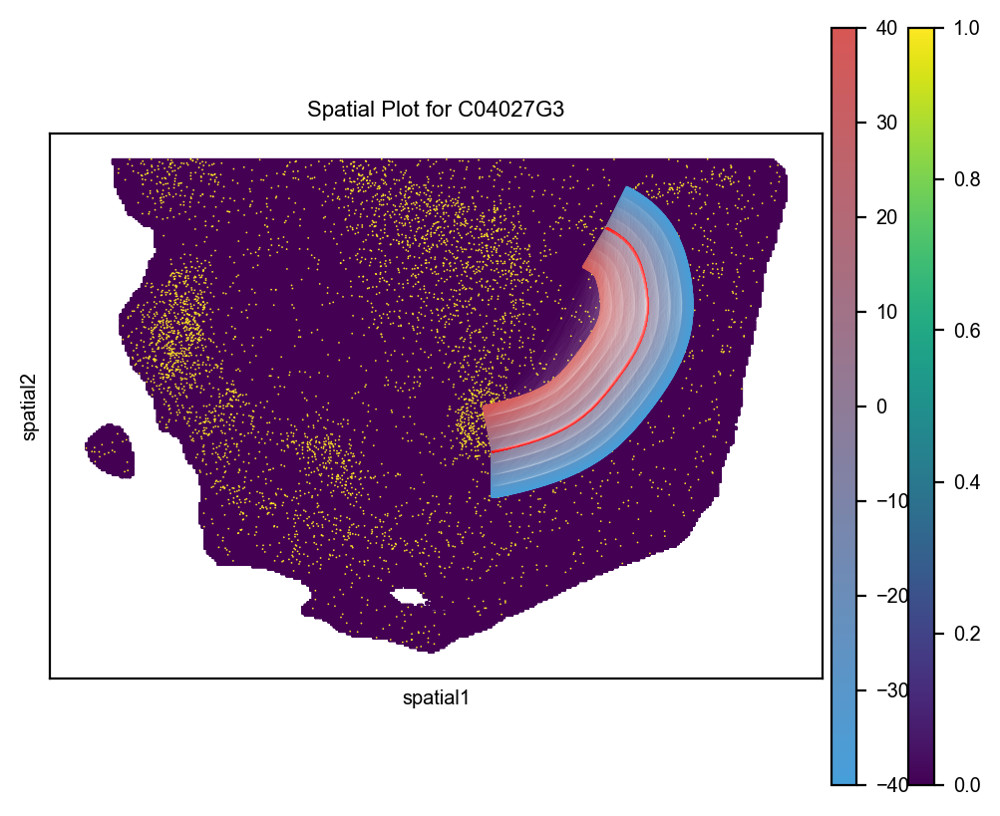

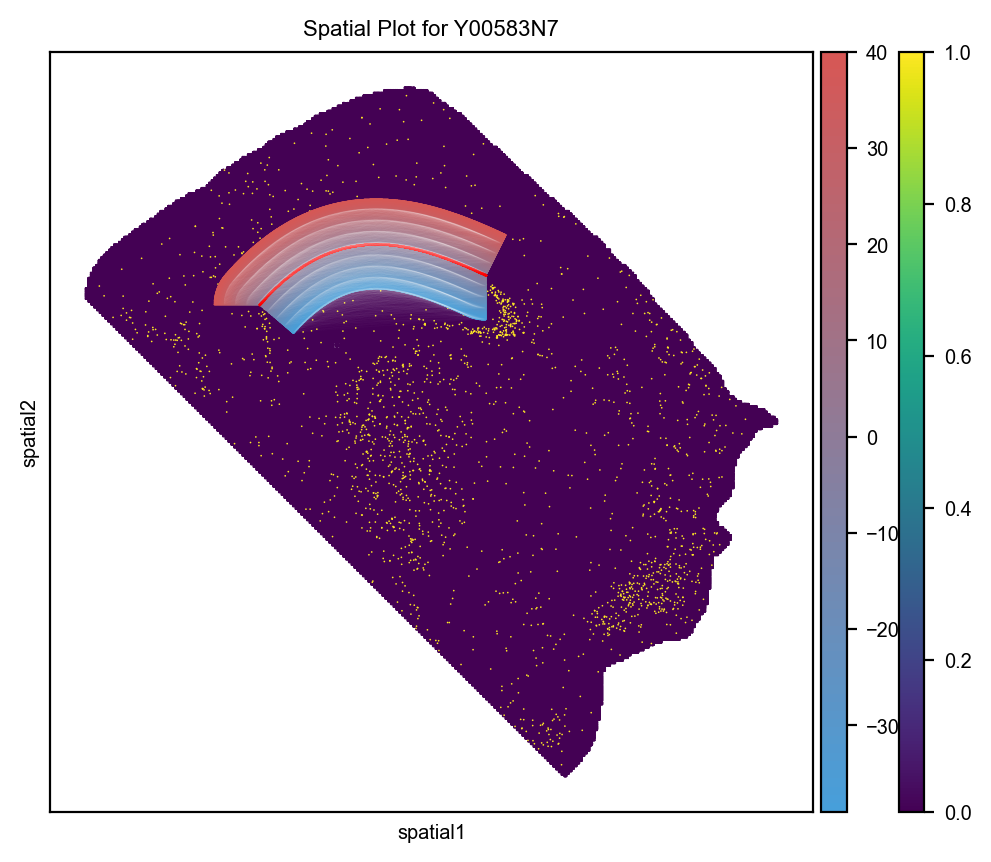

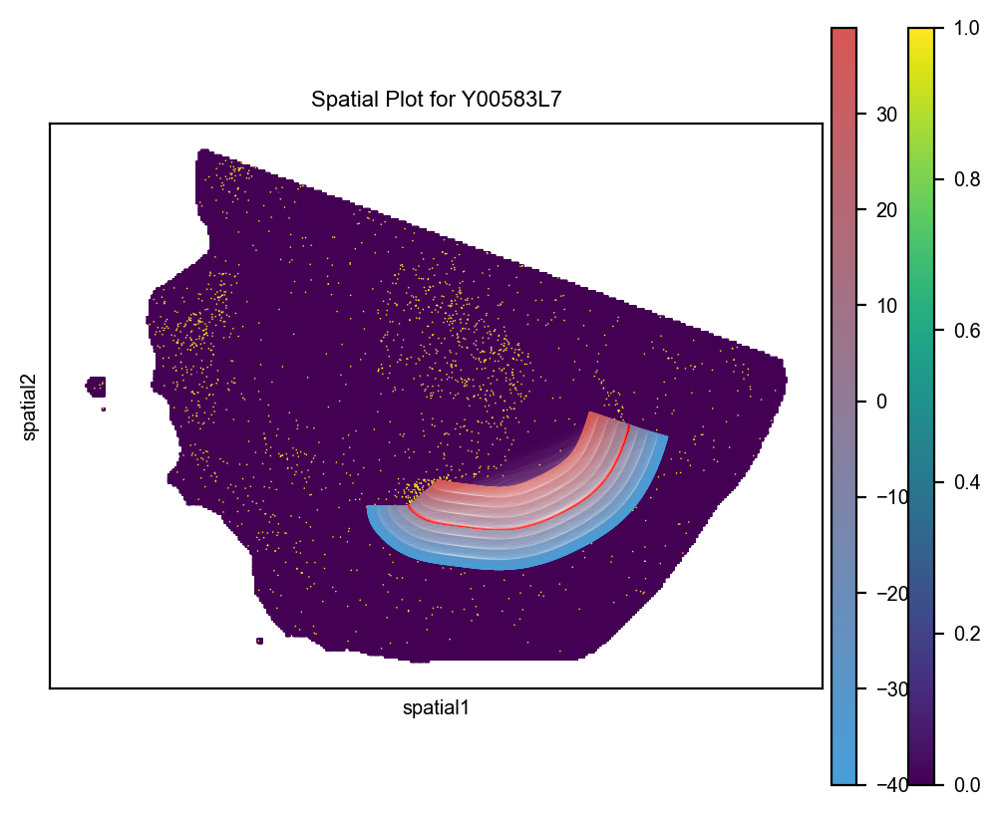

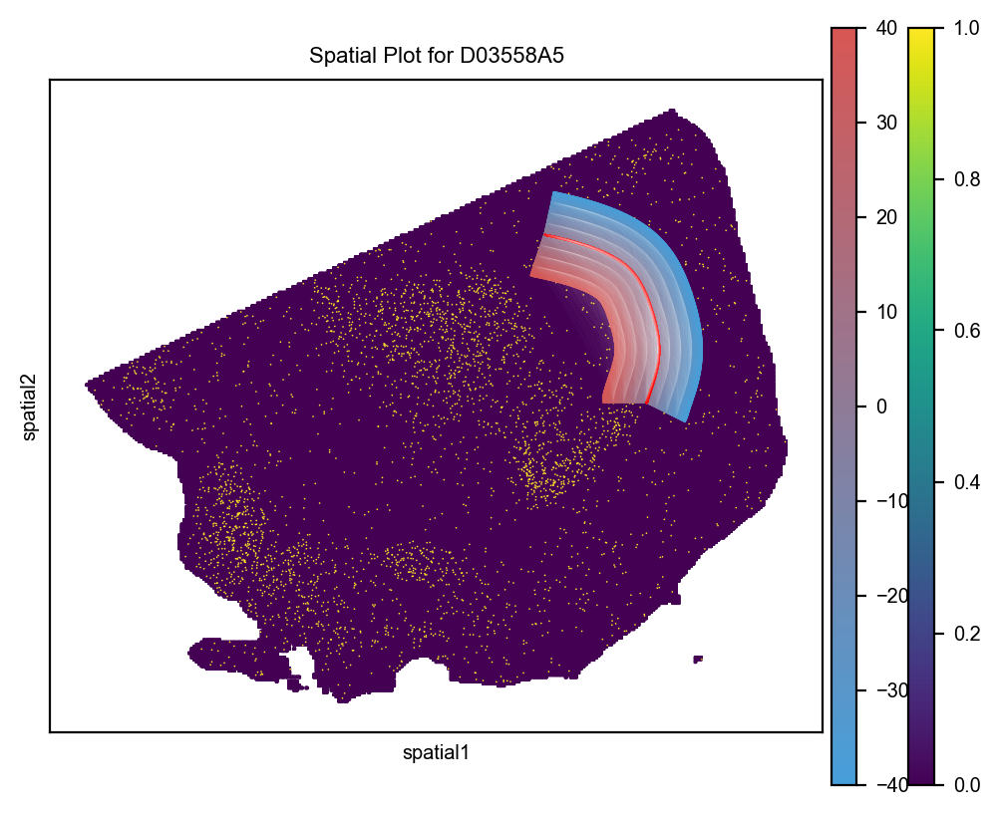

In [24]:
gene = 'Cpne7' 
layer='hip_layer_new'
tissue='hip'

for sample in adata_subsets_bin5.keys():
    data = np.load(f"/home/lixinxing/V2/diffusion/opencv/data_3/left/{sample}_{tissue}_new_coordinates.npz")
    fmt_bdl_ls = data['fmt_bdl_ls']

    adata_subsets_bin5[sample].obs[layer] = pd.to_numeric(adata_subsets_bin5[sample].obs[layer], errors='coerce')  
    adata_hip = adata_subsets_bin5[sample][~adata_subsets_bin5[sample].obs[layer].isna()].copy()

    fig, ax = plt.subplots(figsize=(6, 5))
    sc.pl.spatial(adata_subsets_bin5[sample], color=gene, spot_size=30, show=False, ax=ax, cmap='viridis', vmax=1, vmin=0)
    sc.pl.spatial(adata_hip, color=[layer], spot_size=30, ax=ax, show=False, alpha_img=0.2, legend_loc=None, cmap=cmap)
    
    unique_layers = adata_hip.obs[layer].unique()
    sorted_layers = np.sort(unique_layers)

    for i in range(0, len(sorted_layers), 10):
        layer_value = sorted_layers[i]
        layer_boundary = adata_hip[adata_hip.obs[layer] == layer_value]
        ax.plot(layer_boundary.obsm['spatial'][:, 0], layer_boundary.obsm['spatial'][:, 1], c='white', lw=0.002, alpha=0.7, linestyle='--', rasterized=True)  

    ax.scatter(fmt_bdl_ls[:,0], fmt_bdl_ls[:,1], c='red', s=0.01, alpha=1, rasterized=True)  

    plt.title(f"Spatial Plot for {sample}")
    plt.show()
    # fig.savefig(f'../fig_new/{sample}_{gene}_{tissue}.pdf', dpi=300)  

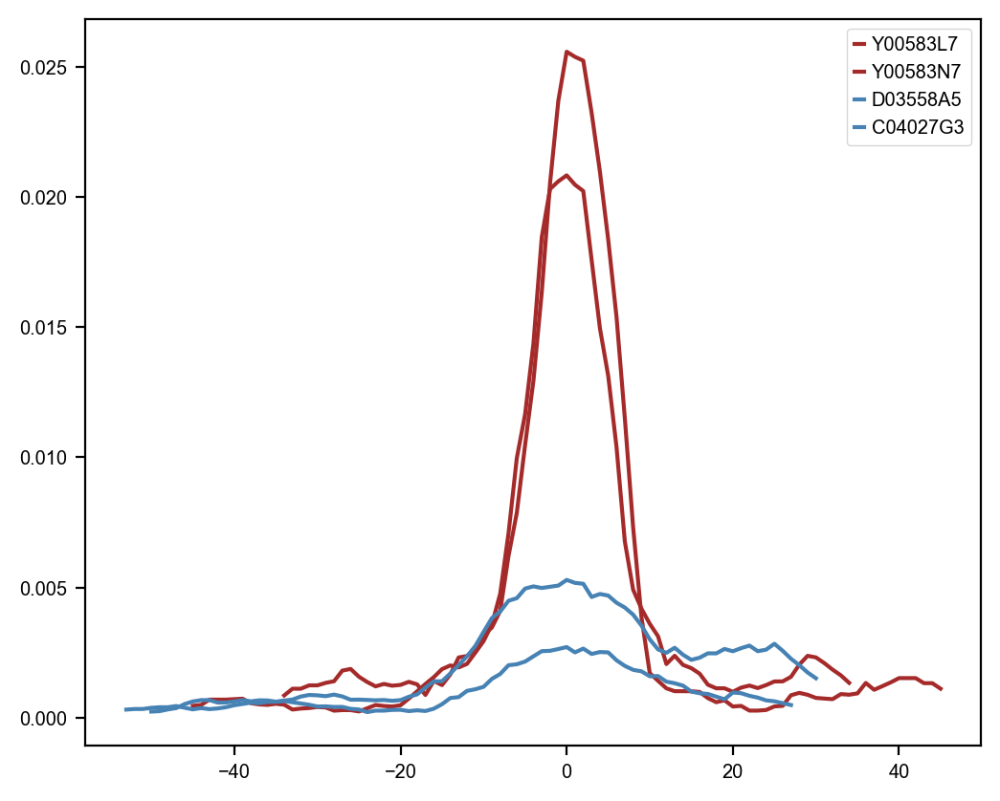

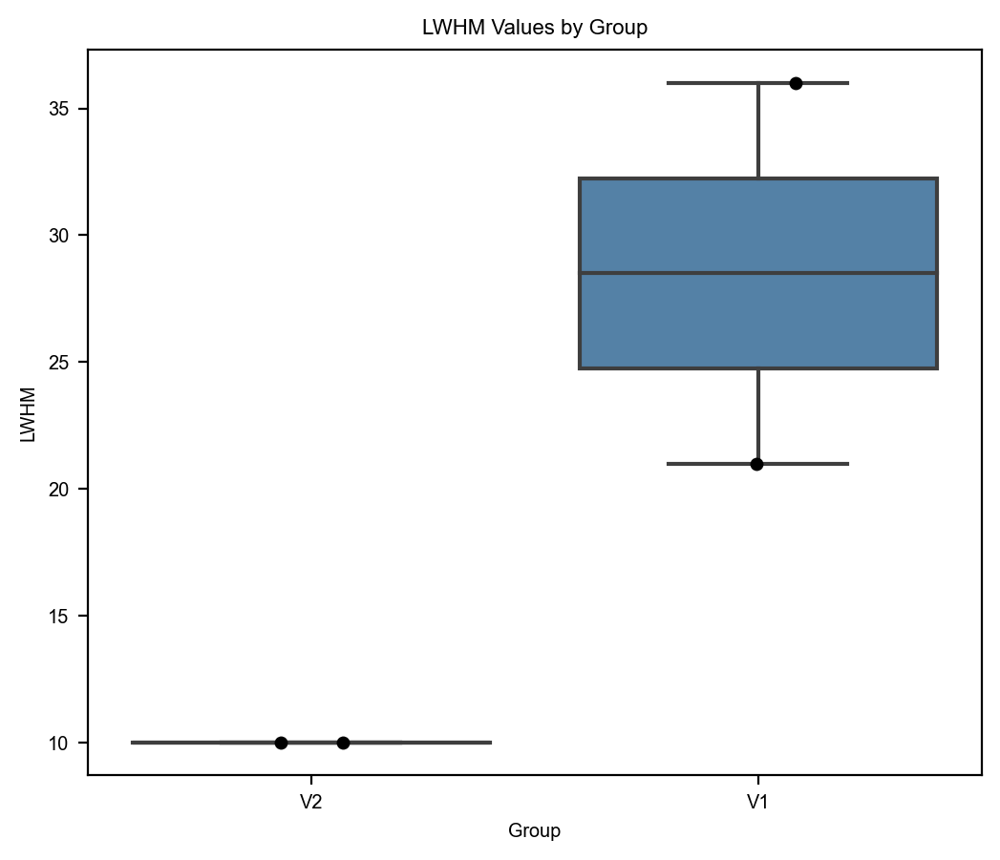

In [25]:
def smooth_curve(points, window_size=10):
    window = np.ones(window_size) / window_size
    y_smooth = np.convolve(points[:, 1], window, mode='same')
    return points[:, 0], y_smooth

gene = 'Cpne7'
layer = 'hip_layer_new'
window_size = 10

rois = {
    'Y00583L7': adata_subsets_bin5['Y00583L7'],
    'Y00583N7': adata_subsets_bin5['Y00583N7'],
    'D03558A5': adata_subsets_bin5['D03558A5'],
    'C04027G3': adata_subsets_bin5['C04027G3'],
}

v1_samples = ['D03558A5', 'C04027G3']
v2_samples = ['Y00583L7', 'Y00583N7']

lwhm_values = []
density_frames = []

for idx, (name, data) in enumerate(rois.items()):
    data_filtered = data[~data.obs[layer].isin(['nan'])].copy()
    
    if issparse(data.X):
        gene_expression = data_filtered[:, gene].X.toarray().squeeze()
    else:
        gene_expression = data_filtered[:, gene].X.squeeze()
    
    data_filtered.obs[gene + '_expression'] = gene_expression

    grouped_data = data_filtered.obs.groupby(layer)[gene + '_expression'].mean().reset_index()
    grouped_data[layer] = pd.to_numeric(grouped_data[layer], errors='coerce')
    grouped_data = grouped_data.dropna().sort_values(by=layer)

    points = grouped_data[[layer, gene + '_expression']].values
    x_fit, y_fit = smooth_curve(points, window_size=window_size)
    
    half_max = np.max(y_fit) / 2
    mask = y_fit >= half_max
    x_half = x_fit[mask]
    LWHM = x_half.max() - x_half.min()
    group = 'V1' if name in v1_samples else 'V2'
    
    temp_df = pd.DataFrame({
        'Adjusted Layer Distance': x_fit - x_fit[np.argmax(y_fit)],
        'Density': y_fit,
        'Sample': name
    })
    density_frames.append(temp_df)
    lwhm_values.append({'Sample': name, 'LWHM': LWHM, 'Group': group})

combined_density_df = pd.concat(density_frames)

plt.figure(figsize=(6, 5))
for name in rois.keys():
    subset = combined_density_df[combined_density_df['Sample'] == name]
    color = 'steelblue' if name in v1_samples else 'brown'
    plt.plot(subset['Adjusted Layer Distance'], subset['Density'], label=name, color=color)

plt.legend()
plt.show()

lwhm_df = pd.DataFrame(lwhm_values)
plt.figure(figsize=(6, 5))
sns.boxplot(data=lwhm_df, x='Group', y='LWHM', palette={'V2': 'brown', 'V1': 'steelblue'})
sns.stripplot(data=lwhm_df, x='Group', y='LWHM', color='black', jitter=True)
plt.title('LWHM Values by Group')
plt.show()

## HIP region — Hpca gene

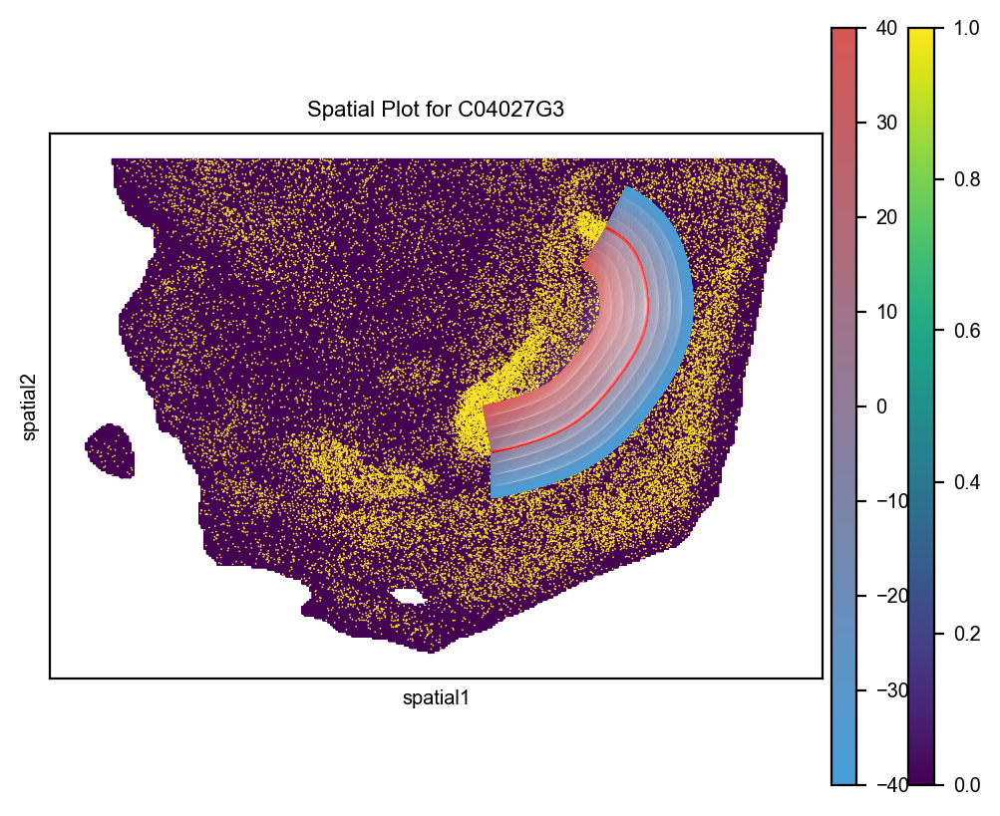

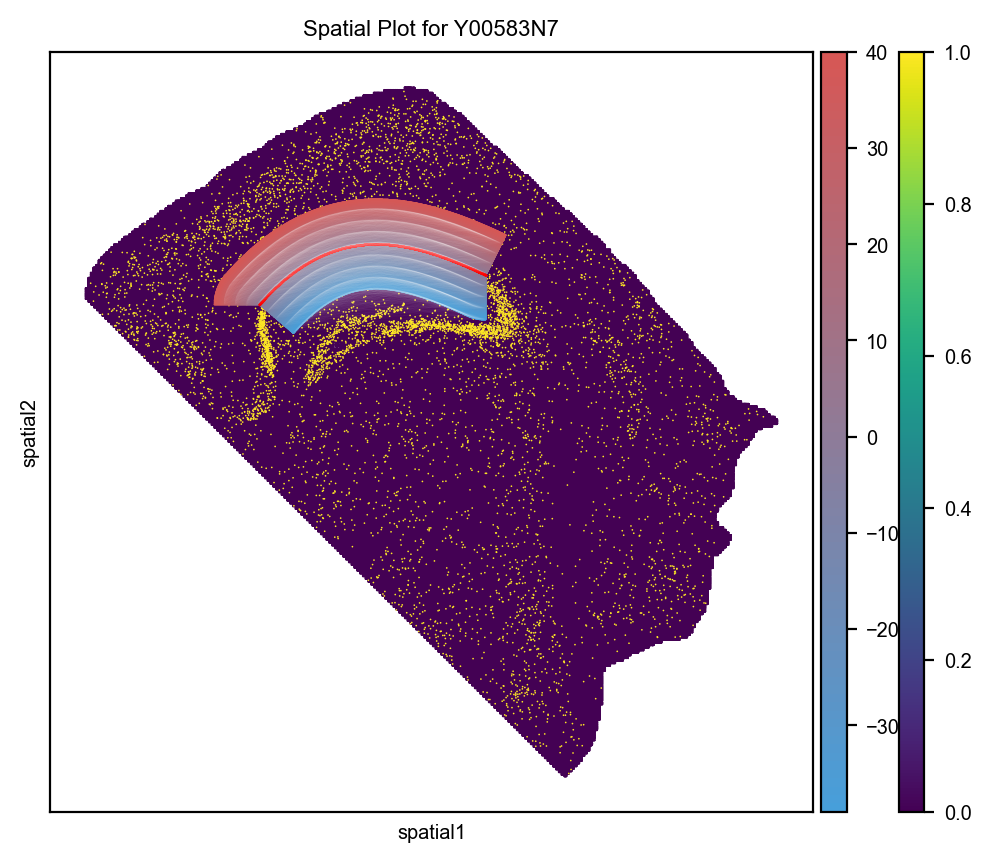

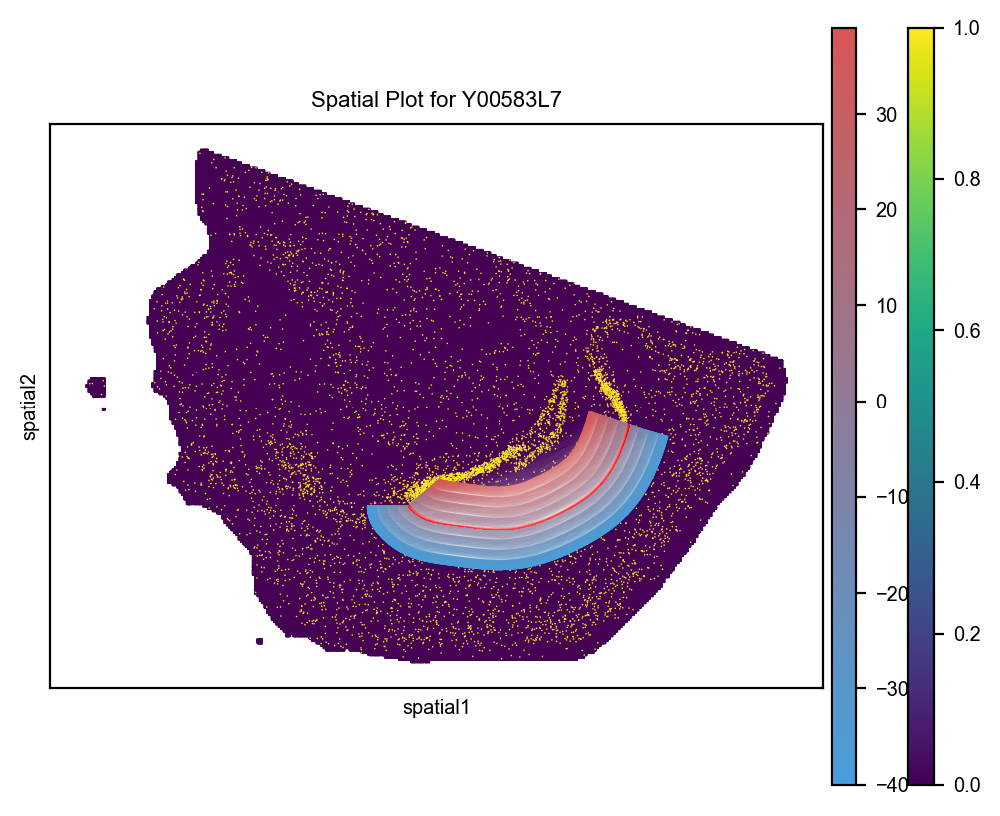

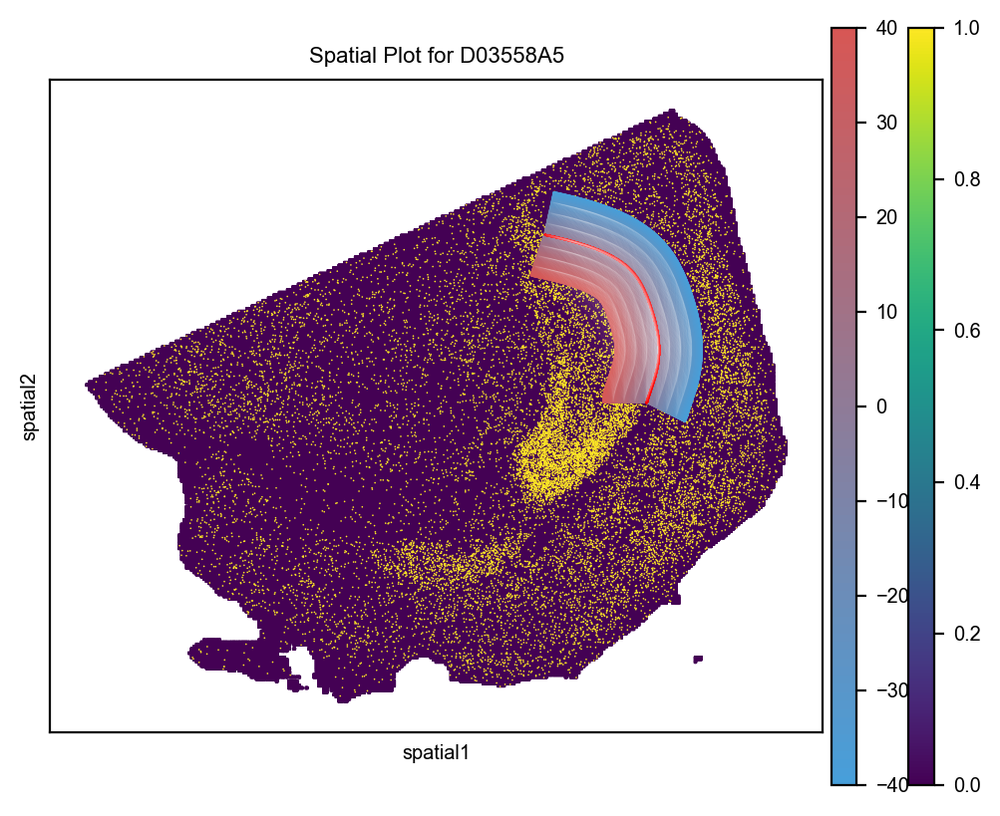

In [57]:
gene = 'Hpca' 
layer='hip_layer_new'
tissue='hip'

for sample in adata_subsets_bin5.keys():
    data = np.load(f"/home/lixinxing/V2/diffusion/opencv/data_3/left/{sample}_{tissue}_new_coordinates.npz")
    fmt_bdl_ls = data['fmt_bdl_ls']

    adata_subsets_bin5[sample].obs[layer] = pd.to_numeric(adata_subsets_bin5[sample].obs[layer], errors='coerce')  
    adata_hip = adata_subsets_bin5[sample][~adata_subsets_bin5[sample].obs[layer].isna()].copy()

    fig, ax = plt.subplots(figsize=(6, 5))
    sc.pl.spatial(adata_subsets_bin5[sample], color=gene, spot_size=30, show=False, ax=ax, cmap='viridis', vmax=1, vmin=0)
    sc.pl.spatial(adata_hip, color=[layer], spot_size=30, ax=ax, show=False, alpha_img=0.2, legend_loc=None, cmap=cmap)
    
    unique_layers = adata_hip.obs[layer].unique()
    sorted_layers = np.sort(unique_layers)

    for i in range(0, len(sorted_layers), 10):
        layer_value = sorted_layers[i]
        layer_boundary = adata_hip[adata_hip.obs[layer] == layer_value]
        ax.plot(layer_boundary.obsm['spatial'][:, 0], layer_boundary.obsm['spatial'][:, 1], c='white', lw=0.002, alpha=0.7, linestyle='--', rasterized=True)  

    ax.scatter(fmt_bdl_ls[:,0], fmt_bdl_ls[:,1], c='red', s=0.01, alpha=1, rasterized=True)  

    plt.title(f"Spatial Plot for {sample}")
    plt.show()
    # fig.savefig(f'../fig_new/{sample}_{gene}_{tissue}.pdf', dpi=300)  

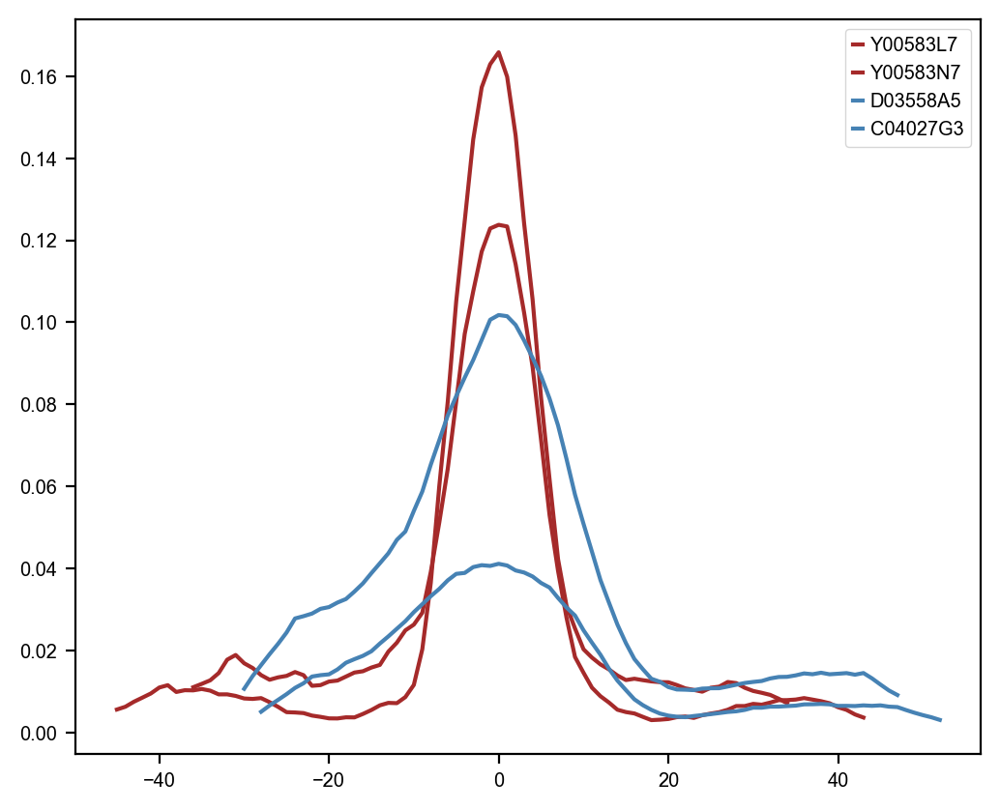

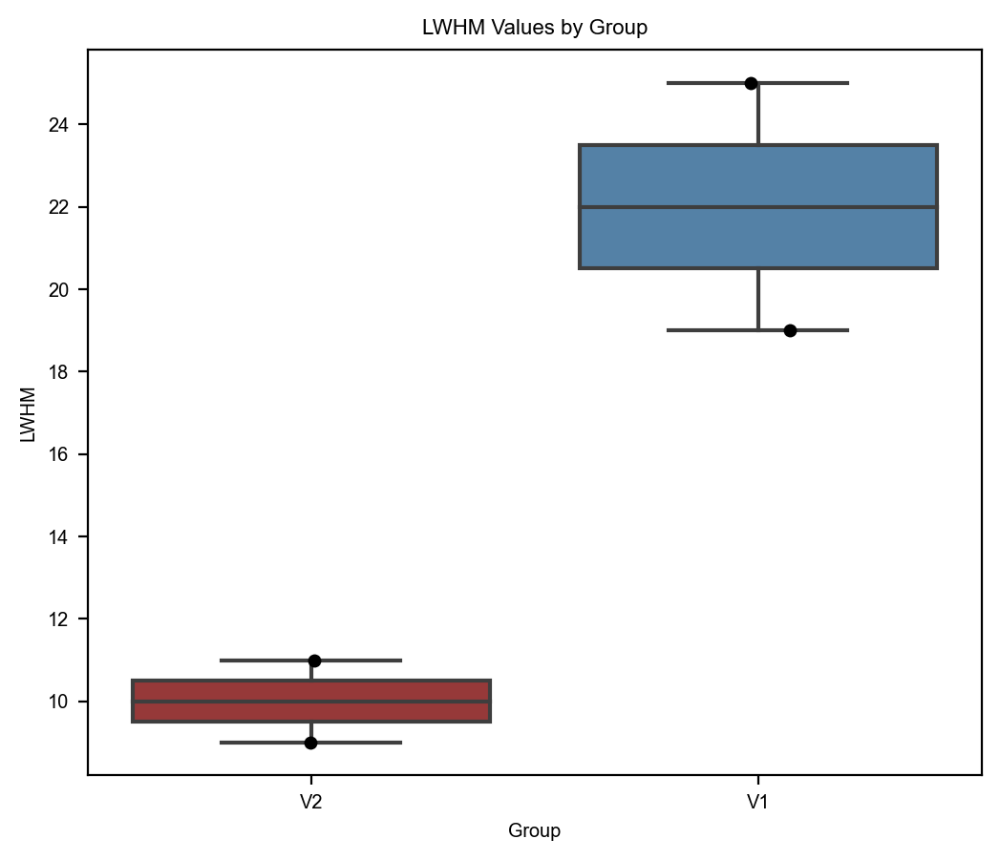

In [102]:
def smooth_curve(points, window_size=10):
    window = np.ones(window_size) / window_size
    y_smooth = np.convolve(points[:, 1], window, mode='same')
    return points[:, 0], y_smooth

gene = 'Hpca'
layer = 'hip_layer_new'
window_size = 10

rois = {
    'Y00583L7': adata_subsets_bin5['Y00583L7'],
    'Y00583N7': adata_subsets_bin5['Y00583N7'],
    'D03558A5': adata_subsets_bin5['D03558A5'],
    'C04027G3': adata_subsets_bin5['C04027G3'],
}

v1_samples = ['D03558A5', 'C04027G3']
v2_samples = ['Y00583L7', 'Y00583N7']

lwhm_values = []
density_frames = []

for idx, (name, data) in enumerate(rois.items()):
    data_filtered = data[~data.obs[layer].isin(['nan'])].copy()
    
    if issparse(data.X):
        gene_expression = data_filtered[:, gene].X.toarray().squeeze()
    else:
        gene_expression = data_filtered[:, gene].X.squeeze()
    
    data_filtered.obs[gene + '_expression'] = gene_expression

    grouped_data = data_filtered.obs.groupby(layer)[gene + '_expression'].mean().reset_index()
    grouped_data[layer] = pd.to_numeric(grouped_data[layer], errors='coerce')
    grouped_data = grouped_data.dropna().sort_values(by=layer)

    points = grouped_data[[layer, gene + '_expression']].values
    x_fit, y_fit = smooth_curve(points, window_size=window_size)
    
    half_max = np.max(y_fit) / 2
    mask = y_fit >= half_max
    x_half = x_fit[mask]
    LWHM = x_half.max() - x_half.min()
    group = 'V1' if name in v1_samples else 'V2'
    
    temp_df = pd.DataFrame({
        'Adjusted Layer Distance': x_fit - x_fit[np.argmax(y_fit)],
        'Density': y_fit,
        'Sample': name
    })
    density_frames.append(temp_df)
    lwhm_values.append({'Sample': name, 'LWHM': LWHM, 'Group': group})

combined_density_df = pd.concat(density_frames)

plt.figure(figsize=(6, 5))
for name in rois.keys():
    subset = combined_density_df[combined_density_df['Sample'] == name]
    color = 'steelblue' if name in v1_samples else 'brown'
    plt.plot(subset['Adjusted Layer Distance'], subset['Density'], label=name, color=color)

plt.legend()
plt.show()

lwhm_df = pd.DataFrame(lwhm_values)
plt.figure(figsize=(6, 5))
sns.boxplot(data=lwhm_df, x='Group', y='LWHM', palette={'V2': 'brown', 'V1': 'steelblue'})
sns.stripplot(data=lwhm_df, x='Group', y='LWHM', color='black', jitter=True)
plt.title('LWHM Values by Group')
plt.show()

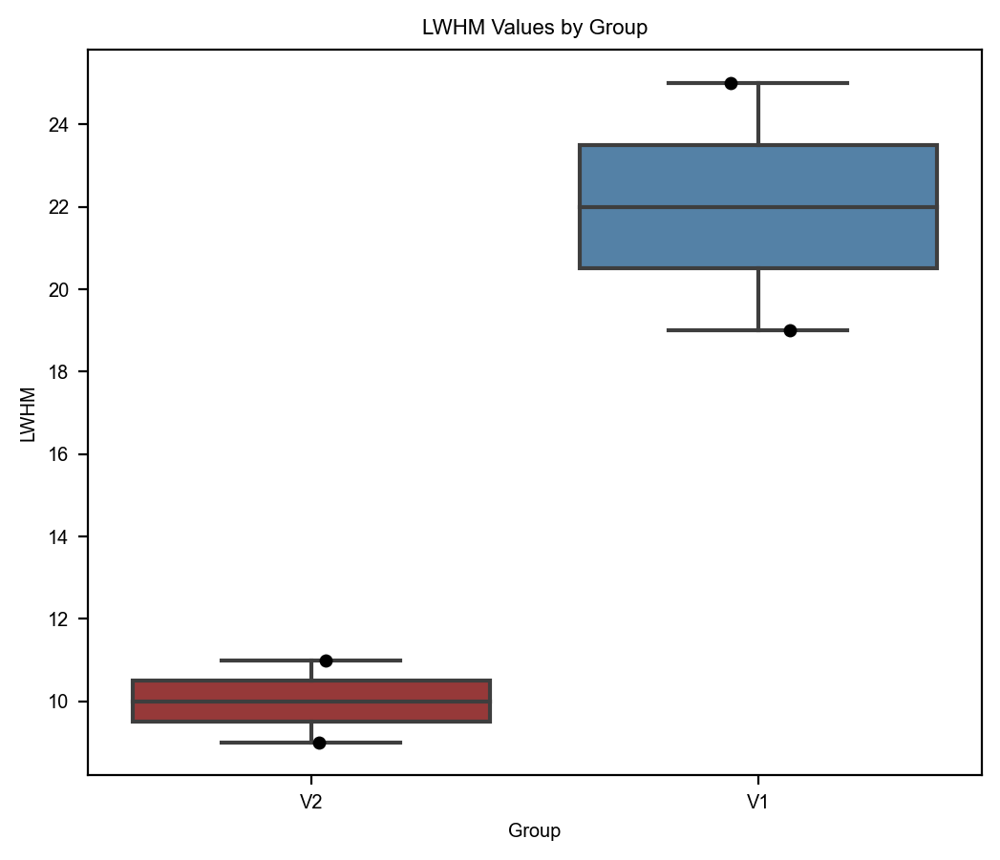

In [120]:
lwhm_df = pd.DataFrame(lwhm_values)
plt.figure(figsize=(6, 5))
sns.boxplot(data=lwhm_df, x='Group', y='LWHM', palette={'V2': 'brown', 'V1': 'steelblue'})
sns.stripplot(data=lwhm_df, x='Group', y='LWHM', color='black', jitter=True)
plt.title('LWHM Values by Group')
plt.savefig(f'/home/lixinxing/V2/diffusion/opencv/data_3/bin5/fig_new/{gene}_{layer}_boxplot.pdf')
plt.show()

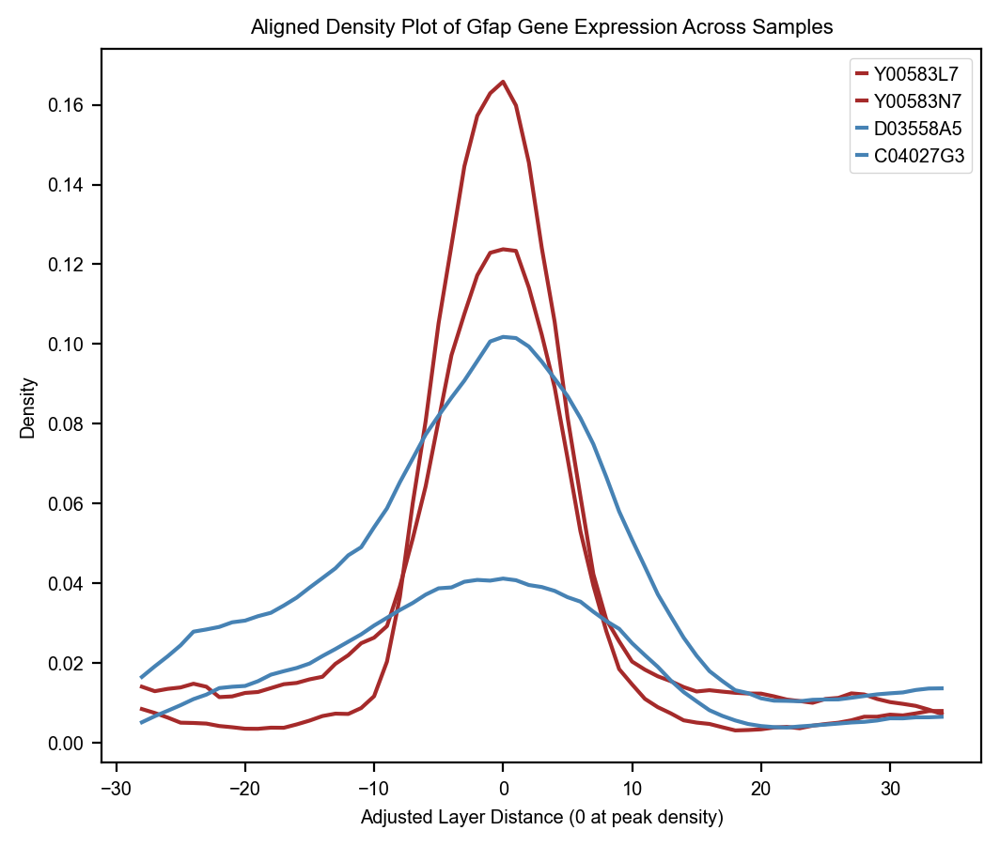

In [104]:
layer_ranges = combined_density_df.groupby('Sample')['Adjusted Layer Distance'].agg([min, max])

filtered_df = combined_density_df[
    (combined_density_df['Adjusted Layer Distance'] >= layer_ranges['min'].max()) &
    (combined_density_df['Adjusted Layer Distance'] <= layer_ranges['max'].min())
]


plt.figure(figsize=(6, 5))
for name in filtered_df['Sample'].unique():
    subset = filtered_df[filtered_df['Sample'] == name]
    color = 'steelblue' if name in v1_samples else 'brown' 
    plt.plot(subset['Adjusted Layer Distance'], subset['Density'], label=name, color=color)

# plt.xlim([-15, 15])

plt.xlabel('Adjusted Layer Distance (0 at peak density)')
plt.ylabel('Density')
plt.title('Aligned Density Plot of Gfap Gene Expression Across Samples')
plt.legend()
plt.savefig(f'/home/lixinxing/V2/diffusion/opencv/data_3/bin5/fig_new/{gene}_{layer}_density.pdf') 
plt.show()

## HIP region--Wipf3 gene Figure S1D

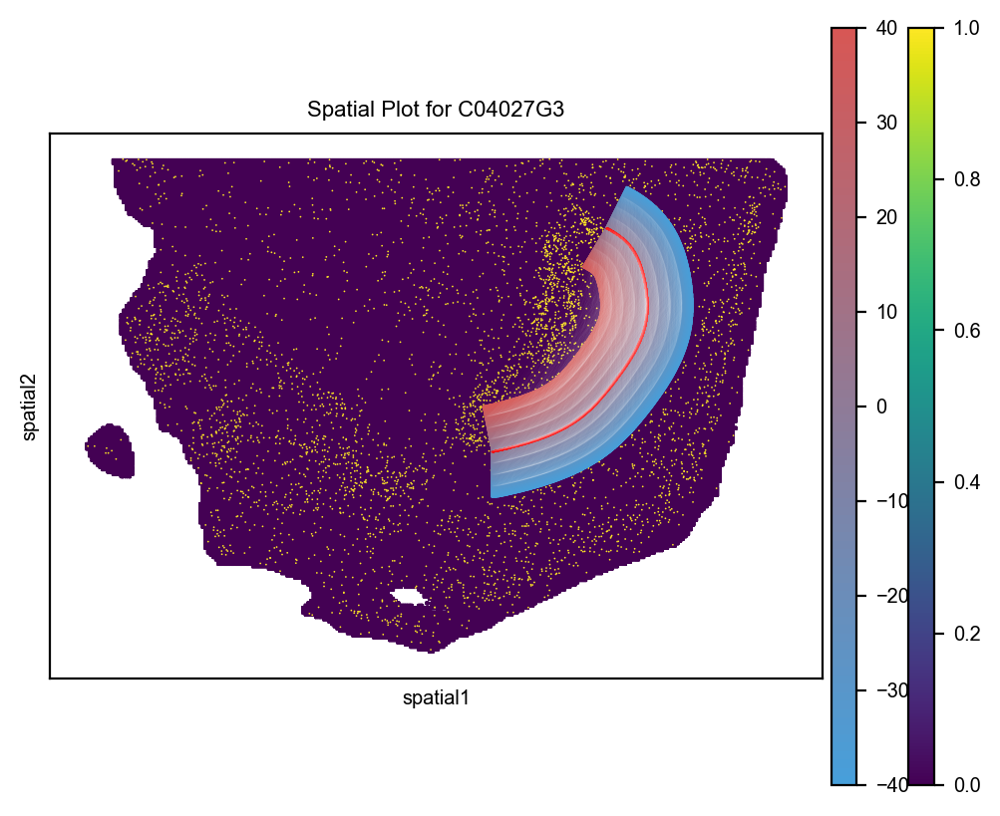

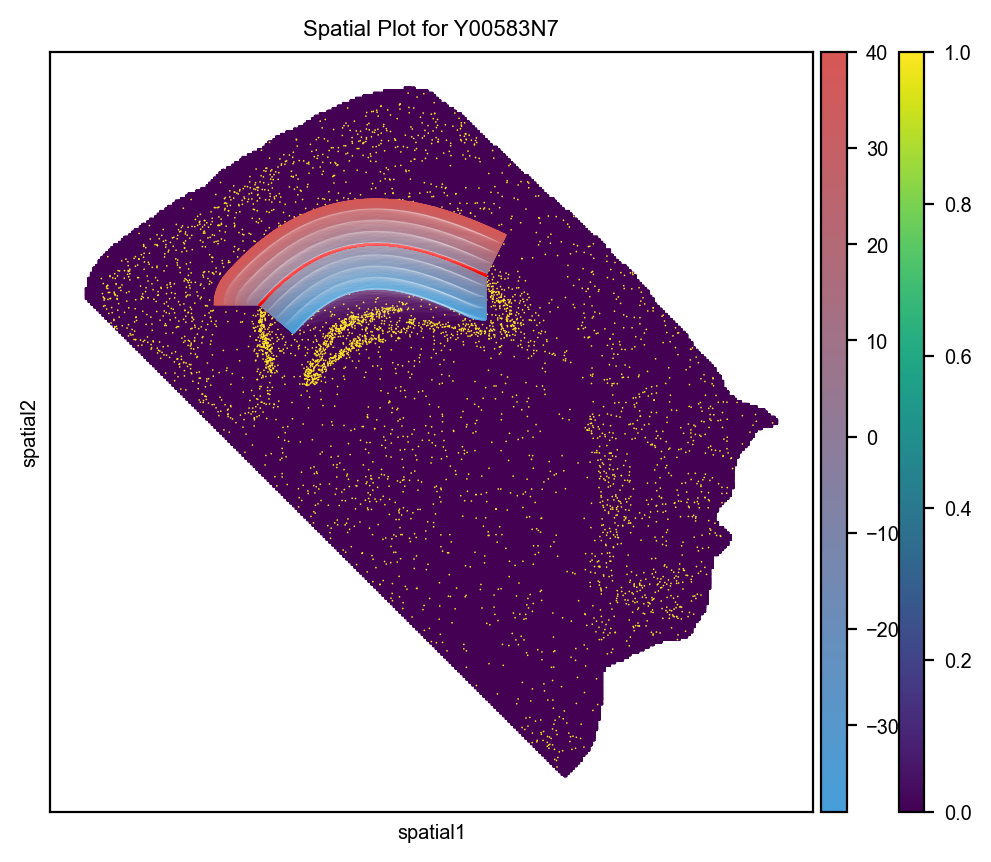

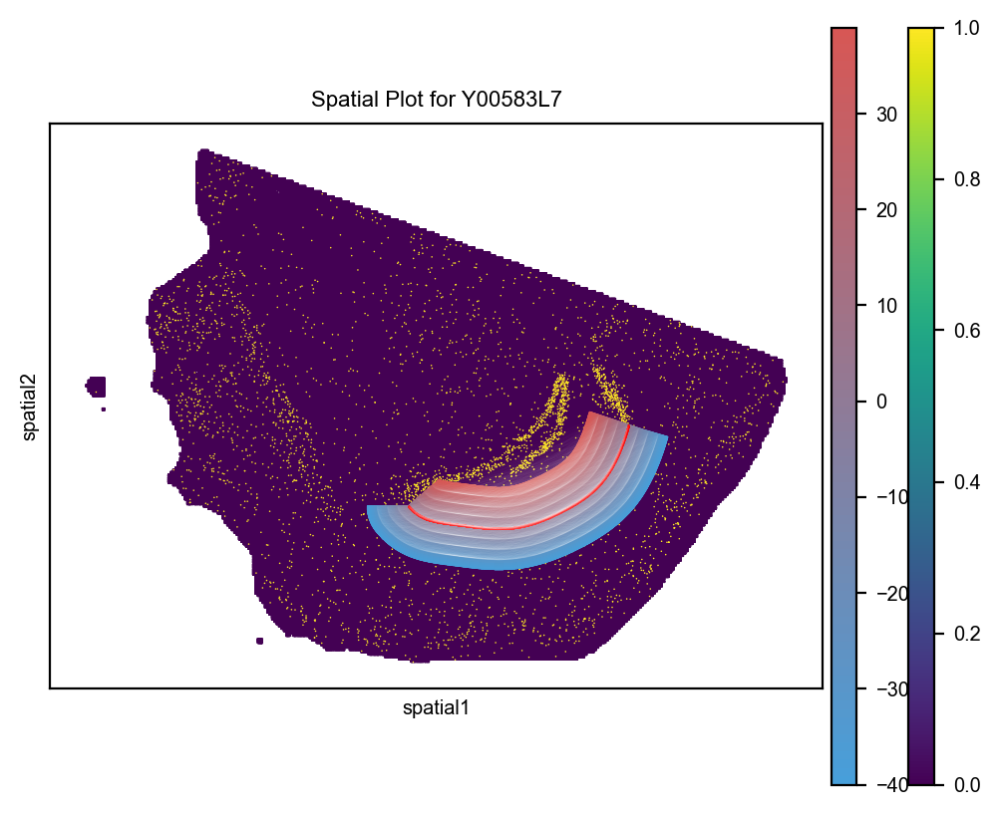

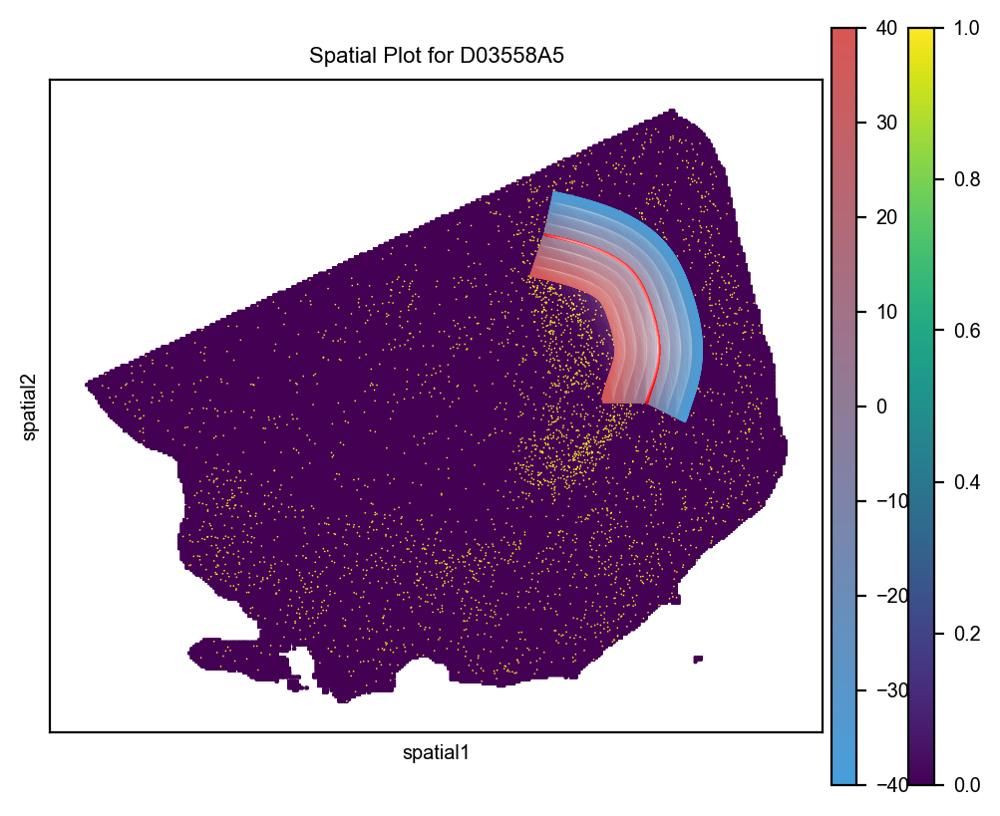

In [ ]:
gene = 'Wipf3' 
layer='hip_layer_new'
tissue='hip'

for sample in adata_subsets_bin5.keys():
    data = np.load(f"/home/lixinxing/V2/diffusion/opencv/data_3/left/{sample}_{tissue}_new_coordinates.npz")
    fmt_bdl_ls = data['fmt_bdl_ls']

    adata_subsets_bin5[sample].obs[layer] = pd.to_numeric(adata_subsets_bin5[sample].obs[layer], errors='coerce')  
    adata_hip = adata_subsets_bin5[sample][~adata_subsets_bin5[sample].obs[layer].isna()].copy()

    fig, ax = plt.subplots(figsize=(6, 5))
    sc.pl.spatial(adata_subsets_bin5[sample], color=gene, spot_size=30, show=False, ax=ax, cmap='viridis', vmax=1, vmin=0)
    sc.pl.spatial(adata_hip, color=[layer], spot_size=30, ax=ax, show=False, alpha_img=0.2, legend_loc=None, cmap=cmap)
    
    unique_layers = adata_hip.obs[layer].unique()
    sorted_layers = np.sort(unique_layers)

    for i in range(0, len(sorted_layers), 10):
        layer_value = sorted_layers[i]
        layer_boundary = adata_hip[adata_hip.obs[layer] == layer_value]
        ax.plot(layer_boundary.obsm['spatial'][:, 0], layer_boundary.obsm['spatial'][:, 1], c='white', lw=0.002, alpha=0.7, linestyle='--', rasterized=True)  

    ax.scatter(fmt_bdl_ls[:,0], fmt_bdl_ls[:,1], c='red', s=0.01, alpha=1, rasterized=True)  

    plt.title(f"Spatial Plot for {sample}")
    plt.show()
    # fig.savefig(f'../fig_new/{sample}_{gene}_{tissue}.pdf', dpi=300)  

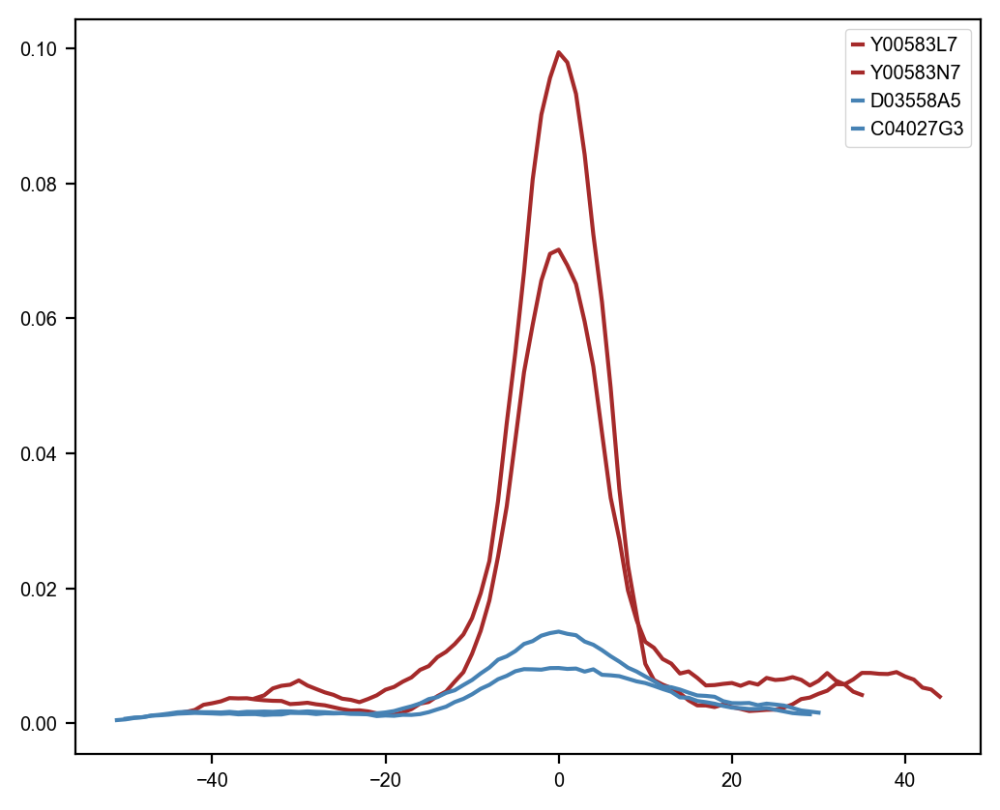

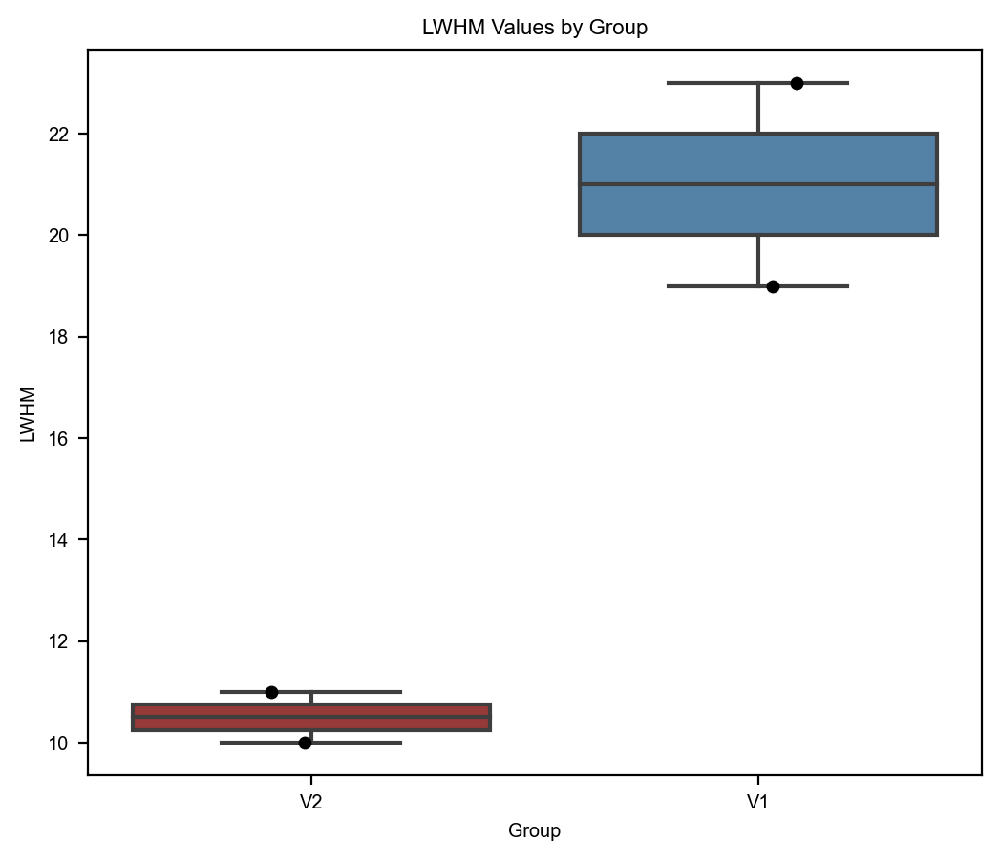

In [26]:
def smooth_curve(points, window_size=10):
    window = np.ones(window_size) / window_size
    y_smooth = np.convolve(points[:, 1], window, mode='same')
    return points[:, 0], y_smooth

gene = 'Wipf3'
layer = 'hip_layer_new'
window_size = 10

rois = {
    'Y00583L7': adata_subsets_bin5['Y00583L7'],
    'Y00583N7': adata_subsets_bin5['Y00583N7'],
    'D03558A5': adata_subsets_bin5['D03558A5'],
    'C04027G3': adata_subsets_bin5['C04027G3'],
}

v1_samples = ['D03558A5', 'C04027G3']
v2_samples = ['Y00583L7', 'Y00583N7']

lwhm_values = []
density_frames = []

for idx, (name, data) in enumerate(rois.items()):
    data_filtered = data[~data.obs[layer].isin(['nan'])].copy()
    
    if issparse(data.X):
        gene_expression = data_filtered[:, gene].X.toarray().squeeze()
    else:
        gene_expression = data_filtered[:, gene].X.squeeze()
    
    data_filtered.obs[gene + '_expression'] = gene_expression

    grouped_data = data_filtered.obs.groupby(layer)[gene + '_expression'].mean().reset_index()
    grouped_data[layer] = pd.to_numeric(grouped_data[layer], errors='coerce')
    grouped_data = grouped_data.dropna().sort_values(by=layer)

    points = grouped_data[[layer, gene + '_expression']].values
    x_fit, y_fit = smooth_curve(points, window_size=window_size)
    
    half_max = np.max(y_fit) / 2
    mask = y_fit >= half_max
    x_half = x_fit[mask]
    LWHM = x_half.max() - x_half.min()
    group = 'V1' if name in v1_samples else 'V2'
    
    temp_df = pd.DataFrame({
        'Adjusted Layer Distance': x_fit - x_fit[np.argmax(y_fit)],
        'Density': y_fit,
        'Sample': name
    })
    density_frames.append(temp_df)
    lwhm_values.append({'Sample': name, 'LWHM': LWHM, 'Group': group})

combined_density_df = pd.concat(density_frames)

plt.figure(figsize=(6, 5))
for name in rois.keys():
    subset = combined_density_df[combined_density_df['Sample'] == name]
    color = 'steelblue' if name in v1_samples else 'brown'
    plt.plot(subset['Adjusted Layer Distance'], subset['Density'], label=name, color=color)

plt.legend()
plt.show()

lwhm_df = pd.DataFrame(lwhm_values)
plt.figure(figsize=(6, 5))
sns.boxplot(data=lwhm_df, x='Group', y='LWHM', palette={'V2': 'brown', 'V1': 'steelblue'})
sns.stripplot(data=lwhm_df, x='Group', y='LWHM', color='black', jitter=True)
plt.title('LWHM Values by Group')
plt.show()

## FT region — Cpne7 gene, Figure 1C

In [36]:
adata_bin5=sc.read_h5ad('/home/lixinxing/V2/diffusion/opencv/data_3/bin5/right_FT_HY/merge_FT_HY_15_900.h5ad') #右脑
unique_chips = adata_bin5.obs['sample'].unique()
adata_subsets_bin5 = {}
for chip in unique_chips:
    adata_subsets_bin5[chip] = adata_bin5[adata_bin5.obs['sample'] == chip].copy()

adata_subsets_bin5

/home/lixinxing/anaconda3/envs/opencv_2/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning:

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.



{'C04027G3': AnnData object with n_obs × n_vars = 3660441 × 28445
     obs: 'orig.ident', 'x', 'y', 'x_new', 'y_new', 'coords', 'sample', 'layer_labels', 'FT_layer', 'HY_layer', 'hip_layer', 'FT_layer_new'
     obsm: 'bin50_spatial', 'spatial',
 'Y00583N7': AnnData object with n_obs × n_vars = 4062265 × 28445
     obs: 'orig.ident', 'x', 'y', 'x_new', 'y_new', 'coords', 'sample', 'layer_labels', 'FT_layer', 'HY_layer', 'hip_layer', 'FT_layer_new'
     obsm: 'bin50_spatial', 'spatial',
 'Y00583L7': AnnData object with n_obs × n_vars = 3945618 × 28445
     obs: 'orig.ident', 'x', 'y', 'x_new', 'y_new', 'coords', 'sample', 'layer_labels', 'FT_layer', 'HY_layer', 'hip_layer', 'FT_layer_new'
     obsm: 'bin50_spatial', 'spatial',
 'D03558A5': AnnData object with n_obs × n_vars = 3917977 × 28445
     obs: 'orig.ident', 'x', 'y', 'x_new', 'y_new', 'coords', 'sample', 'layer_labels', 'FT_layer', 'HY_layer', 'hip_layer', 'FT_layer_new'
     obsm: 'bin50_spatial', 'spatial'}

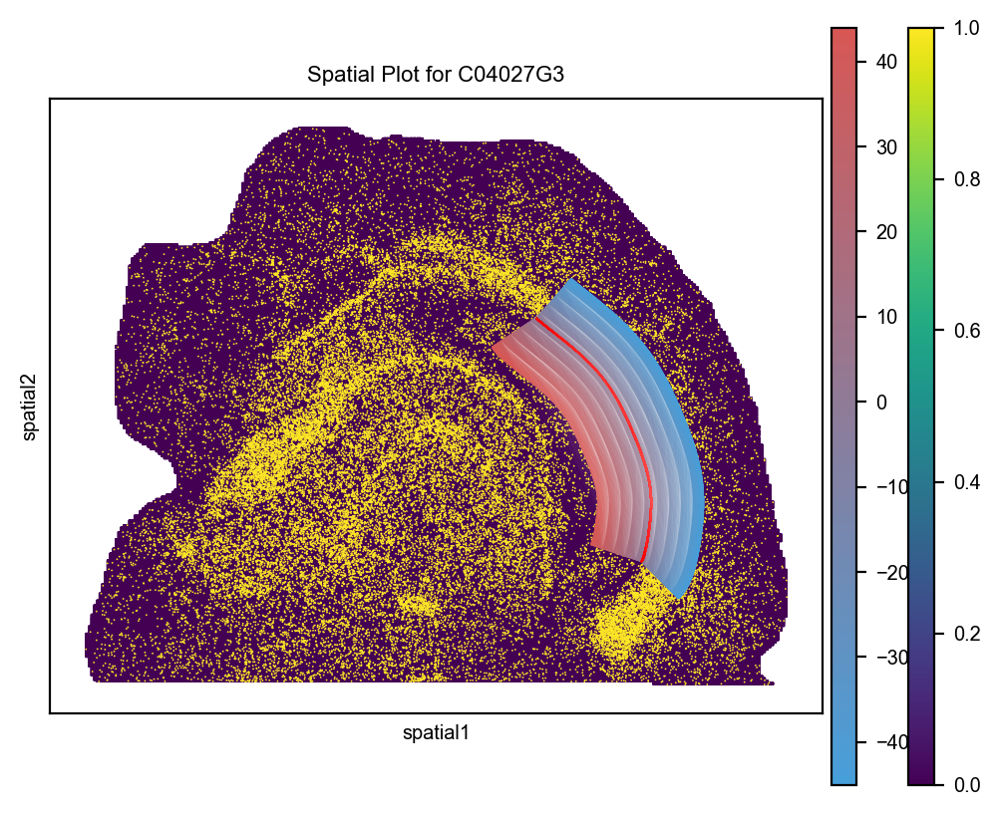

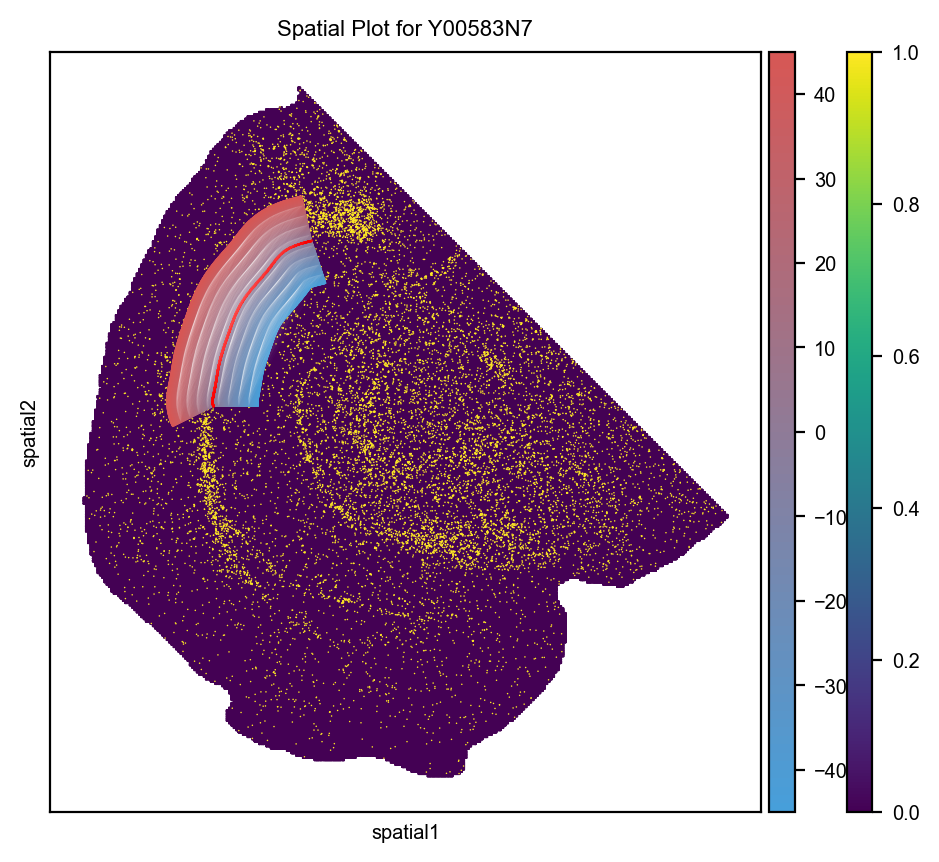

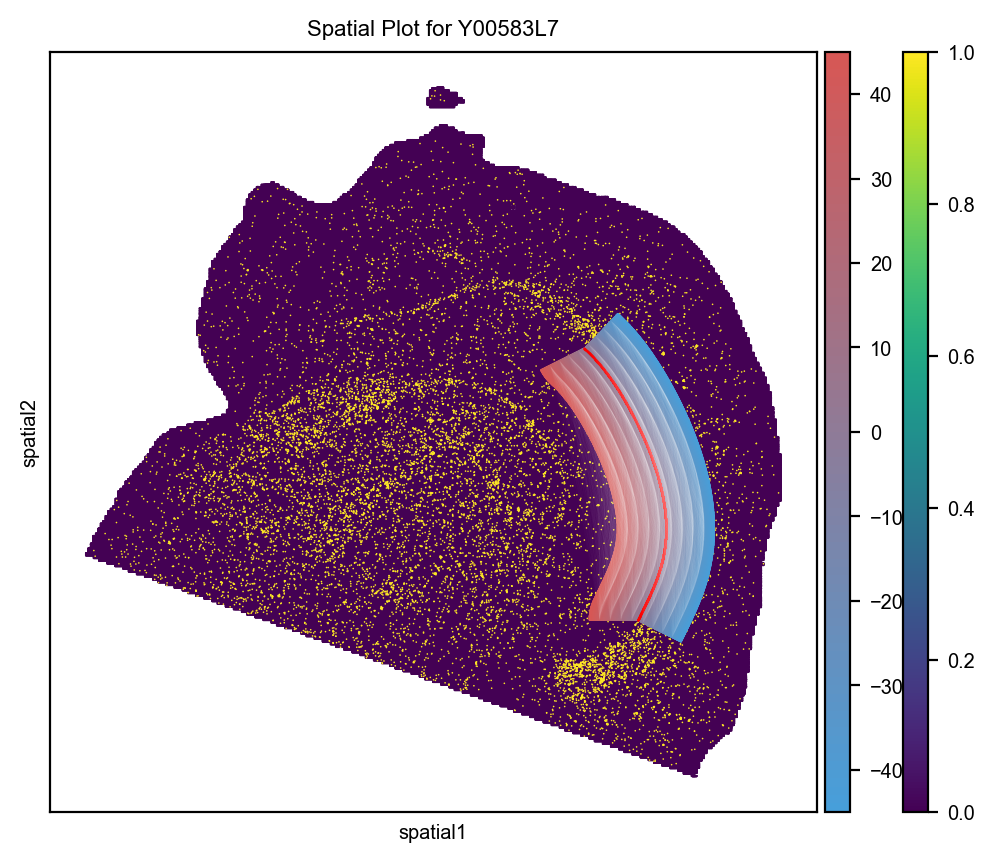

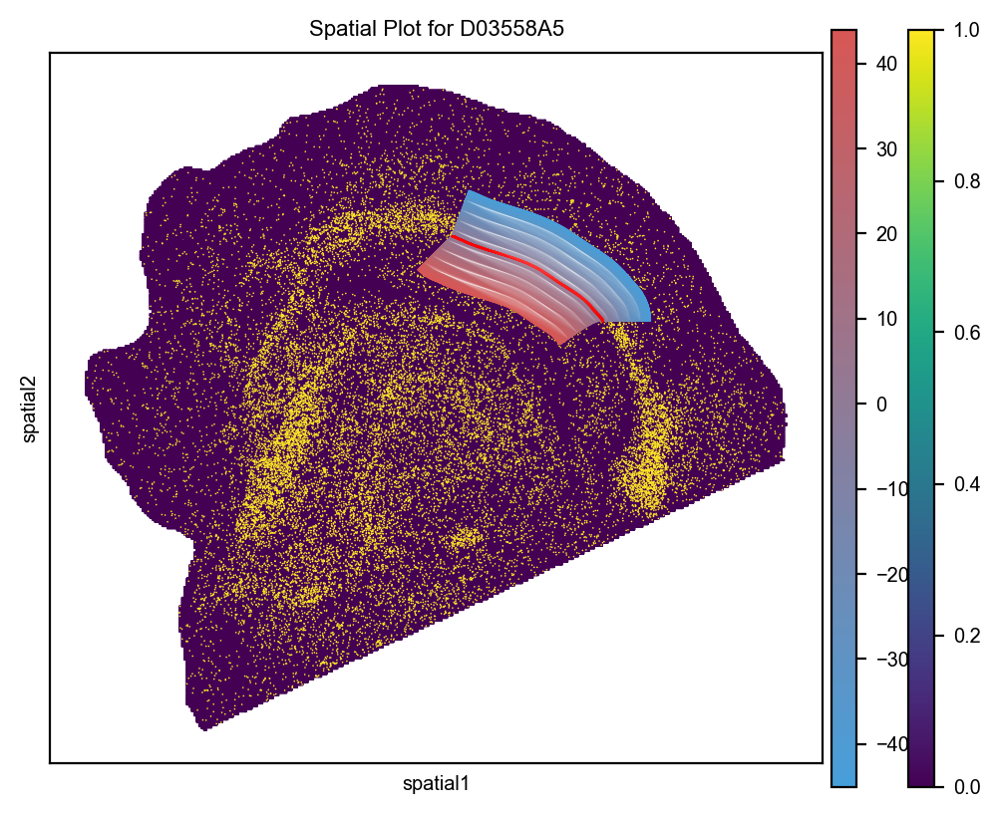

In [50]:
gene = 'Cnp' 
layer='FT_layer_new'
tissue='FT'

for sample in adata_subsets_bin5.keys():
    data = np.load(f"/home/lixinxing/V2/diffusion/opencv/data_3/right/{sample}_{tissue}_short_new_coordinates.npz")
    fmt_bdl_ls = data['fmt_bdl_ls']

    adata_subsets_bin5[sample].obs[layer] = pd.to_numeric(adata_subsets_bin5[sample].obs[layer], errors='coerce')  
    adata_hip = adata_subsets_bin5[sample][~adata_subsets_bin5[sample].obs[layer].isna()].copy()

    fig, ax = plt.subplots(figsize=(6, 5))
    sc.pl.spatial(adata_subsets_bin5[sample], color=gene, spot_size=30, show=False, ax=ax, cmap='viridis', vmax=1, vmin=0)
    sc.pl.spatial(adata_hip, color=[layer], spot_size=30, ax=ax, show=False, alpha_img=0.2, legend_loc=None, cmap=cmap)
    
    unique_layers = adata_hip.obs[layer].unique()
    sorted_layers = np.sort(unique_layers)

    for i in range(0, len(sorted_layers), 10):
        layer_value = sorted_layers[i]
        layer_boundary = adata_hip[adata_hip.obs[layer] == layer_value]
        ax.plot(layer_boundary.obsm['spatial'][:, 0], layer_boundary.obsm['spatial'][:, 1], c='white', lw=0.002, alpha=0.7, linestyle='--', rasterized=True)  

    ax.scatter(fmt_bdl_ls[:,0], fmt_bdl_ls[:,1], c='red', s=0.01, alpha=1, rasterized=True)  

    plt.title(f"Spatial Plot for {sample}")
    plt.show()
    # fig.savefig(f'../fig_new/{sample}_{gene}_{tissue}.pdf', dpi=300)  

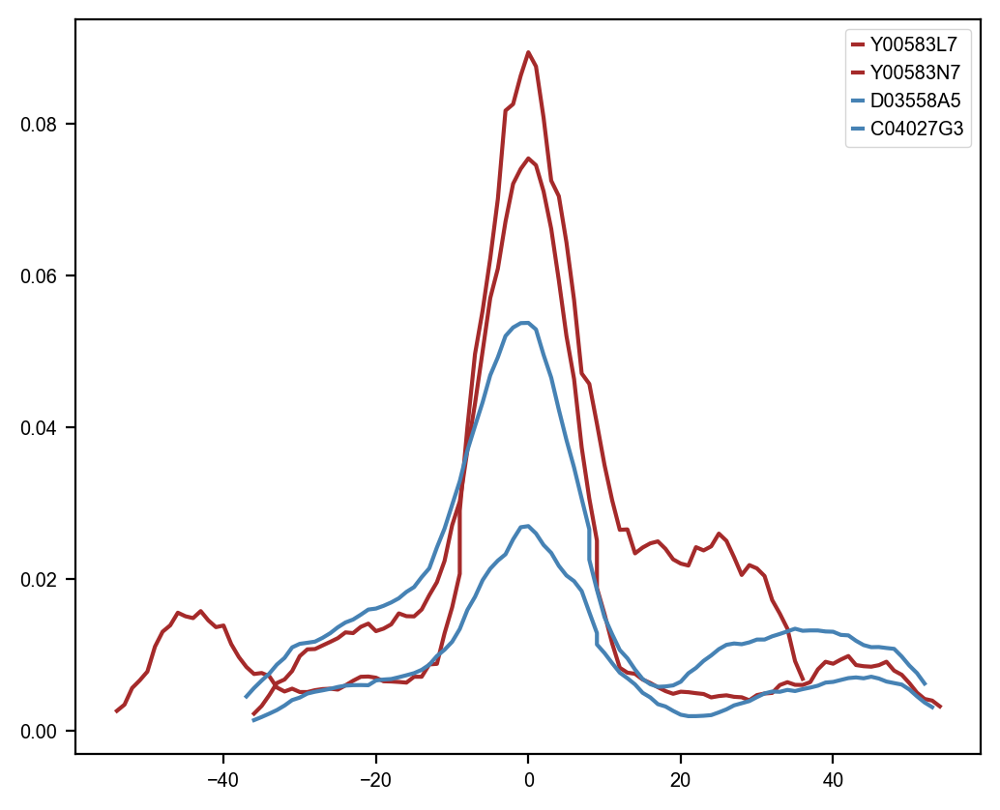

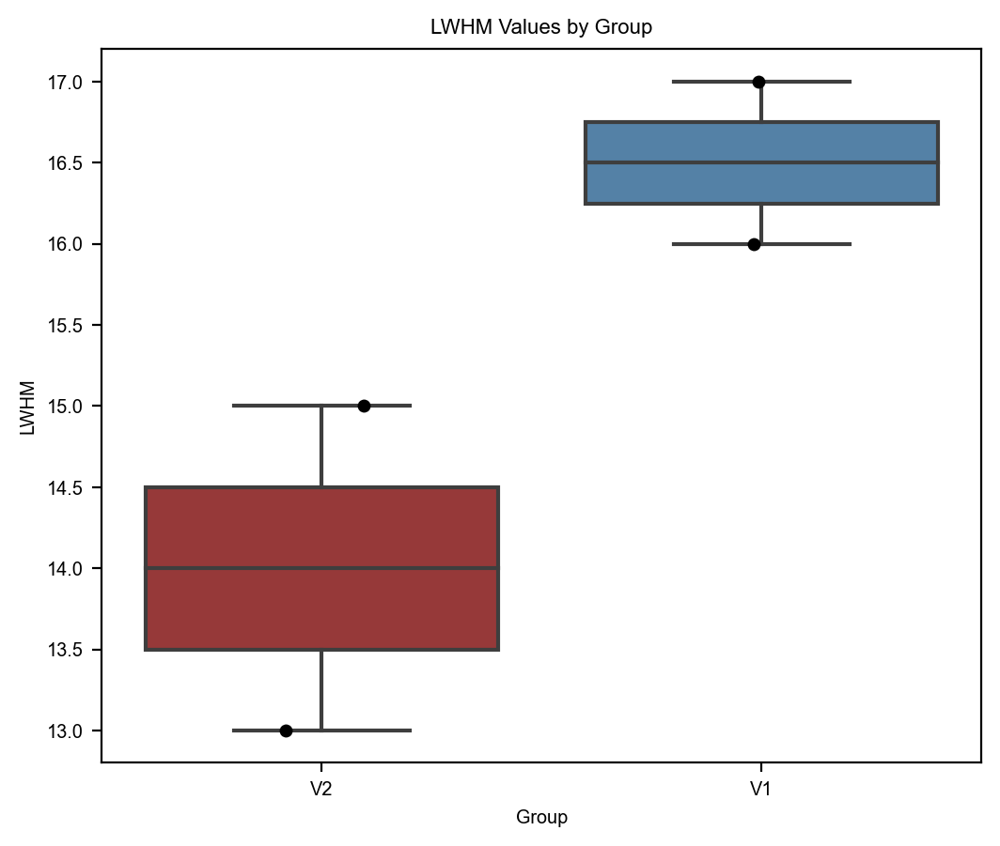

In [42]:
def smooth_curve(points, window_size=10):
    window = np.ones(window_size) / window_size
    y_smooth = np.convolve(points[:, 1], window, mode='same')
    return points[:, 0], y_smooth

gene = 'Cnp' 
layer='FT_layer_new'
window_size = 10

rois = {
    'Y00583L7': adata_subsets_bin5['Y00583L7'],
    'Y00583N7': adata_subsets_bin5['Y00583N7'],
    'D03558A5': adata_subsets_bin5['D03558A5'],
    'C04027G3': adata_subsets_bin5['C04027G3'],
}

v1_samples = ['D03558A5', 'C04027G3']
v2_samples = ['Y00583L7', 'Y00583N7']

lwhm_values = []
density_frames = []

for idx, (name, data) in enumerate(rois.items()):
    data_filtered = data[~data.obs[layer].isin(['nan'])].copy()

    if issparse(data.X):
        gene_expression = data_filtered[:, gene].X.toarray().squeeze()
    else:
        gene_expression = data_filtered[:, gene].X.squeeze()
    
    data_filtered.obs[gene + '_expression'] = gene_expression

    grouped_data = data_filtered.obs.groupby(layer)[gene + '_expression'].mean().reset_index()
    grouped_data[layer] = pd.to_numeric(grouped_data[layer], errors='coerce')
    grouped_data = grouped_data.dropna().sort_values(by=layer)

    points = grouped_data[[layer, gene + '_expression']].values
    x_fit, y_fit = smooth_curve(points, window_size=window_size)
    
    half_max = np.max(y_fit) / 2
    mask = y_fit >= half_max
    x_half = x_fit[mask]
    LWHM = x_half.max() - x_half.min()
    group = 'V1' if name in v1_samples else 'V2'
    
    temp_df = pd.DataFrame({
        'Adjusted Layer Distance': x_fit - x_fit[np.argmax(y_fit)],
        'Density': y_fit,
        'Sample': name
    })
    density_frames.append(temp_df)
    lwhm_values.append({'Sample': name, 'LWHM': LWHM, 'Group': group})

combined_density_df = pd.concat(density_frames)

plt.figure(figsize=(6, 5))
for name in rois.keys():
    subset = combined_density_df[combined_density_df['Sample'] == name]
    color = 'steelblue' if name in v1_samples else 'brown'
    plt.plot(subset['Adjusted Layer Distance'], subset['Density'], label=name, color=color)

plt.legend()
plt.show()

lwhm_df = pd.DataFrame(lwhm_values)
plt.figure(figsize=(6, 5))
sns.boxplot(data=lwhm_df, x='Group', y='LWHM', palette={'V2': 'brown', 'V1': 'steelblue'})
sns.stripplot(data=lwhm_df, x='Group', y='LWHM', color='black', jitter=True)
plt.title('LWHM Values by Group')
plt.show()

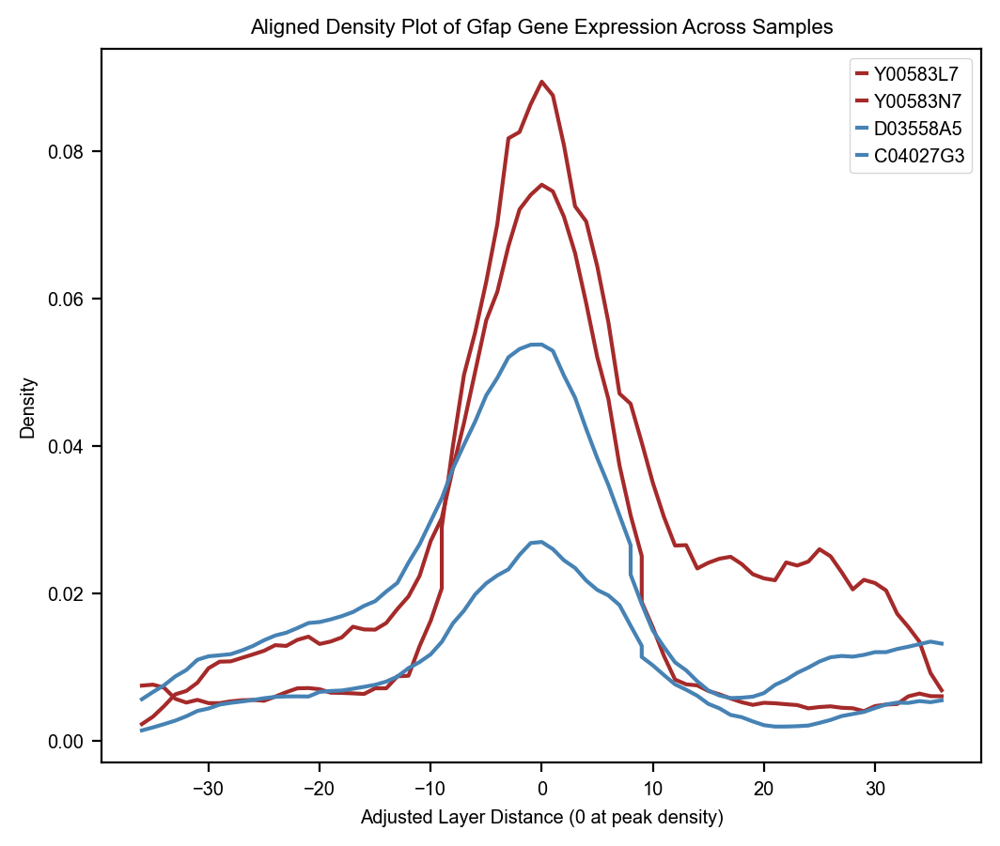

In [49]:
layer_ranges = combined_density_df.groupby('Sample')['Adjusted Layer Distance'].agg([min, max])

common_min_layer = layer_ranges['min'].max()
common_max_layer = layer_ranges['max'].min()

filtered_df = combined_density_df[
    (combined_density_df['Adjusted Layer Distance'] >= common_min_layer) &
    (combined_density_df['Adjusted Layer Distance'] <= common_max_layer)
]


plt.figure(figsize=(6, 5))
for name in filtered_df['Sample'].unique():
    subset = filtered_df[filtered_df['Sample'] == name]
    color = 'steelblue' if name in v1_samples else 'brown' 
    plt.plot(subset['Adjusted Layer Distance'], subset['Density'], label=name, color=color)

# plt.xlim([-15, 15])

plt.xlabel('Adjusted Layer Distance (0 at peak density)')
plt.ylabel('Density')
plt.title('Aligned Density Plot of Gfap Gene Expression Across Samples')
plt.legend()
# plt.savefig(f'/home/lixinxing/V2/diffusion/opencv/data_3/bin5/fig_new/{gene}_{layer}_density.pdf') 
plt.show()

# Statistics

In [126]:
df=pd.read_csv('/home/lixinxing/V2/github/v2_LWHM.csv',index_col=0)
mean_lwhm = df.groupby(['Gene', 'Group'])['LWHM'].mean().reset_index()
mean_lwhm

,Gene,Group,LWHM
0,Cnp,V1,16.5
1,Cnp,V2,14.0
2,Cpne7,V1,28.5
3,Cpne7,V2,10.0
4,Hpca,V1,22.0
5,Hpca,V2,10.0
6,Neurdo6,V1,15.0
7,Neurdo6,V2,9.5
8,Wipf3,V1,21.0
9,Wipf3,V2,10.5


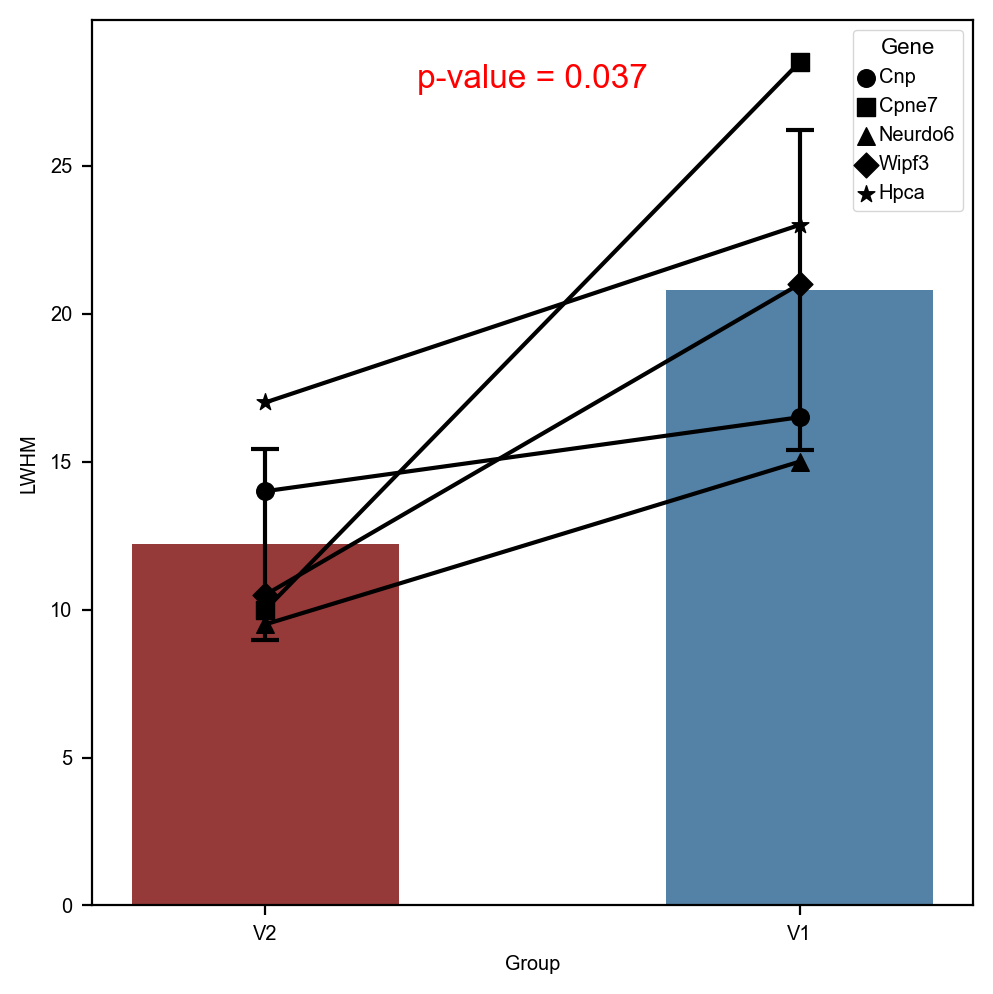

In [93]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy import stats

palette = {'V1': 'steelblue', 'V2': 'brown'}
# markers= {'Cnp': '#83a4a9', 'Cpne7': '#587a8c', 'Neurdo6': '#d5bb83', 'Wipf3': '#d0bec0', 'Hpca': '#b16c6d'}
markers = {'Cnp': 'o', 'Cpne7': 's', 'Neurdo6': '^', 'Wipf3': 'D', 'Hpca': '*'}

plt.figure(figsize=(5, 5))
sns.barplot(data=mean_lwhm, x='Group', y='LWHM', palette=palette, errwidth=0, width=0.5, order=['V2', 'V1'])

for _, row in group_stats.iterrows():
    plt.errorbar(x=['V2', 'V1'].index(row['Group']), y=row['mean'], yerr=row['std'], fmt='none', color='black', capsize=5, capthick=1.5, lw=1.5)

for gene, marker in markers.items():
    if gene in mean_lwhm['Gene'].values:
        gene_data = mean_lwhm[mean_lwhm['Gene'] == gene]
        x_values = gene_data['Group'].map({'V1': 1, 'V2': 0}).values
        y_values = gene_data['LWHM'].values
        # plt.scatter(x_values, y_values, color=[markers[gene] for gene in gene_data['Gene']], marker=marker, label=gene, s=40)
        plt.scatter(x_values, y_values, color='black', marker=marker, label=gene, s=40)
        plt.plot(x_values, y_values, color='black', linestyle='-')

plt.legend(title='Gene', loc='upper right')
t_stat, p_value = stats.ttest_rel(mean_lwhm[mean_lwhm['Group'] == 'V1']['LWHM'], mean_lwhm[mean_lwhm['Group'] == 'V2']['LWHM'])
plt.annotate(f'p-value = {p_value:.3f}', xy=(0.5, 0.95), xycoords='axes fraction', ha='center', va='top', fontsize=12, color='red')
plt.xticks(ticks=[0, 1], labels=['V2', 'V1'])
plt.tight_layout()
# plt.savefig('/home/lixinxing/V2/github/lwhm_merge.pdf')
plt.show()


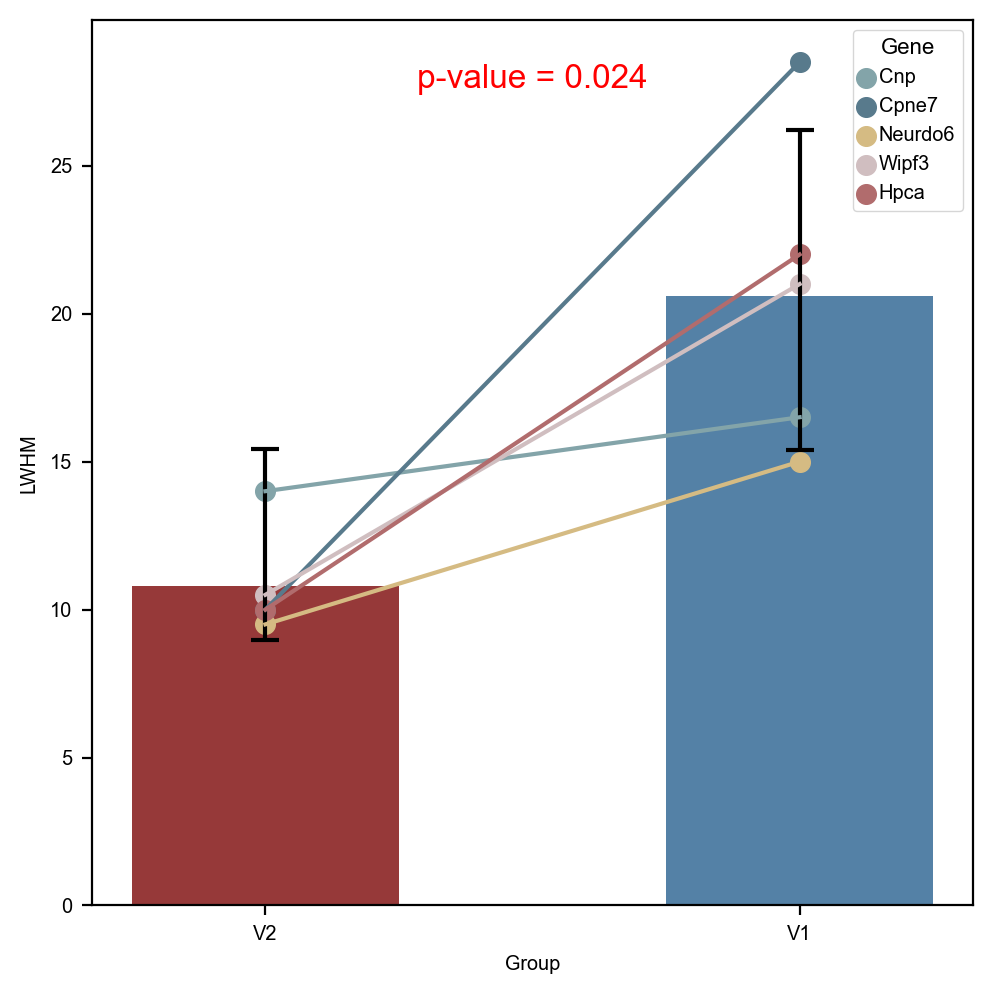

In [128]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy import stats

palette = {'V1': 'steelblue', 'V2': 'brown'}
gene_colors = {'Cnp': '#83a4a9', 'Cpne7': '#587a8c', 'Neurdo6': '#d5bb83', 'Wipf3': '#d0bec0', 'Hpca': '#b16c6d'}

plt.figure(figsize=(5, 5))
sns.barplot(data=mean_lwhm, x='Group', y='LWHM', palette=palette, errwidth=0, width=0.5, order=['V2', 'V1'])

for _, row in group_stats.iterrows():
    plt.errorbar(x=['V2', 'V1'].index(row['Group']), y=row['mean'], yerr=row['std'], fmt='none', color='black', capsize=5, capthick=1.5, lw=1.5)

for gene in gene_colors.keys():
    if gene in mean_lwhm['Gene'].values:
        gene_data = mean_lwhm[mean_lwhm['Gene'] == gene]
        x_values = gene_data['Group'].map({'V1': 1, 'V2': 0}).values
        y_values = gene_data['LWHM'].values
        plt.scatter(x_values, y_values, color=gene_colors[gene], marker='o', label=gene, s=50)
        plt.plot(x_values, y_values, color=gene_colors[gene], linestyle='-')

plt.legend(title='Gene', loc='upper right')
t_stat, p_value = stats.ttest_rel(mean_lwhm[mean_lwhm['Group'] == 'V1']['LWHM'], mean_lwhm[mean_lwhm['Group'] == 'V2']['LWHM'])
plt.annotate(f'p-value = {p_value:.3f}', xy=(0.5, 0.95), xycoords='axes fraction', ha='center', va='top', fontsize=12, color='red')
plt.xticks(ticks=[0, 1], labels=['V2', 'V1'])
plt.tight_layout()
plt.savefig('/home/lixinxing/V2/github/lwhm_merge.pdf')
plt.show()
